# Instalar Bibliotecas

In [1]:
!pip install opencv-python  
#aqui lo utilizaremos para acceder a la webcam y recopilar imagenes

In [2]:
import cv2 #import opencv (biblioteca libre de vision artificial)
import uuid #sirve para crear identificadores para los objetos
import os #permite realizar operaciones dependientes del sistema operativo
import time #realizar operaciones dependientes del tiempo

# (Definir los conuntos de imágenes)

In [3]:
conjuntos = ['Clear plastic bottle'] #pet y pvc
numerodeimagenes = 5


# Instalar dataset TACO

instalar librerias y anotaciones

In [4]:
%matplotlib inline
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
dataset_path = './TACO/data'
anns_file_path = dataset_path + '/' + 'annotations.json'
# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)
# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
#categories['supercategory':'Bottle cap'] = 'Cap'
#categories[supercategory][4] = 'Cap'
for cat_it in categories:
    #if cat_it['supercategory'] == 'Bottle cap':
        #cat_it['supercategory']='Cap'
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)
identidad = []
for img in imgs:
    identidad.append(img['id'])
dataset

C:\Users\DANIEL\anaconda3\envs\recopilaimagenes\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


{'info': {'year': 2019,
  'version': None,
  'description': 'TACO',
  'contributor': None,
  'url': None,
  'date_created': '2019-12-19T16:11:15.258399+00:00'},
 'images': [{'id': 0,
   'width': 1537,
   'height': 2049,
   'file_name': 'batch_1/000006.jpg',
   'license': None,
   'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png',
   'coco_url': None,
   'date_captured': None,
   'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'},
  {'id': 1,
   'width': 1537,
   'height': 2049,
   'file_name': 'batch_1/000008.jpg',
   'license': None,
   'flickr_url': 'https://farm66.staticflickr.com/65535/47803331152_ee00755a2e_o.png',
   'coco_url': None,
   'date_captured': None,
   'flickr_640_url': 'https://farm66.staticflickr.com/65535/47803331152_19beae025a_z.jpg'},
  {'id': 2,
   'width': 1537,
   'height': 2049,
   'file_name': 'batch_1/000010.jpg',
   'license': None,
   'flickr_url': 'https://farm66.staticflickr.com/65535/

Numero de anotaciones por categoría

C:\Users\DANIEL\AppData\Local\Temp\ipykernel_16440\622915498.py:11: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


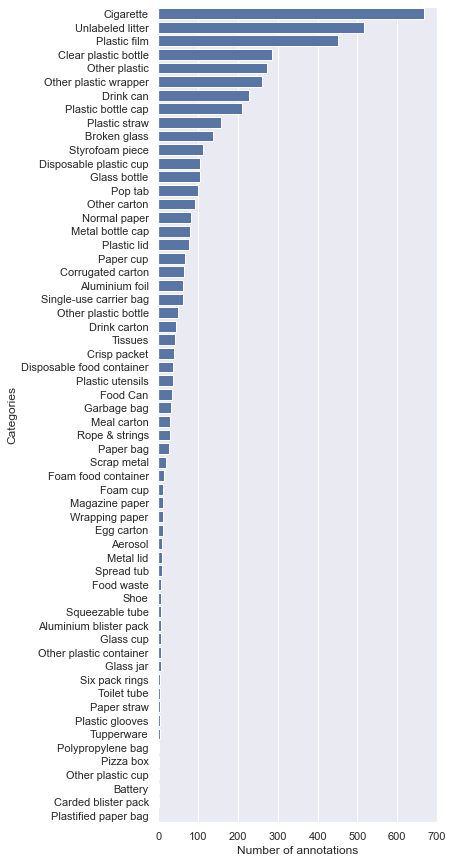

In [5]:
# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b")

# fig = plot_1.get_figure()
# fig.savefig("output.png")

Numero de anotaciones por supercategoría

C:\Users\DANIEL\AppData\Local\Temp\ipykernel_16440\3616635075.py:17: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


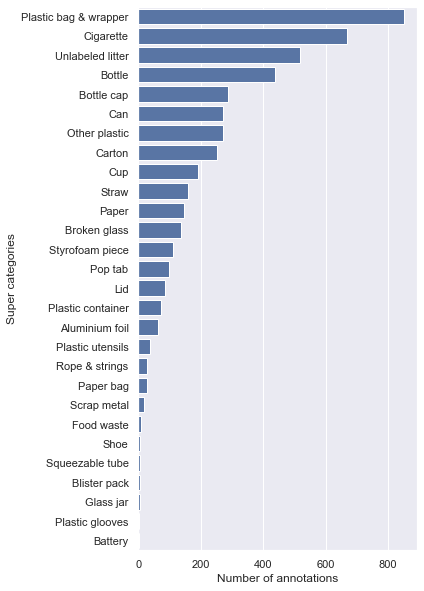

In [6]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', 0, False)

# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b")
#plot_1.set_title('Annotations per super category',fontsize=20)

Mostrar los datos del fondo

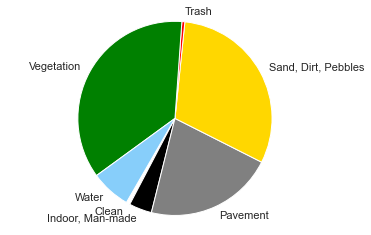

In [7]:
# Get scene cat names
scene_cats = dataset['scene_categories']
scene_name = []
for scene_cat in scene_cats:
    scene_name.append(scene_cat['name'])

nr_scenes = len(scene_cats)
scene_cat_histogram = np.zeros(nr_scenes,dtype=int)

for scene_ann in dataset['scene_annotations']:    
    scene_ann_ids = scene_ann['background_ids']
    for scene_ann_id in scene_ann_ids:
        if scene_ann_id<len(scene_cats):
            scene_cat_histogram[scene_ann_id]+=1

# Convert to DataFrame
df = pd.DataFrame({'scene_cats': scene_cats, 'nr_annotations': scene_cat_histogram})
 
# Plot
colors = ['white','black','gray', 'gold', 'red','green','lightskyblue']
plt.pie(scene_cat_histogram, labels=scene_name, colors = colors,
      shadow=False, startangle=-120)
 
plt.axis('equal')
plt.show()

Gráfico de datos

In [9]:
from graphviz import Digraph
# Note: graphviz may require more than pip installation due to path issue: e.g. brew install graphviz for mac

#g = Digraph('G', filename='hello.gv')
dot = Digraph('Dataset graph', filename='asd.gv')
dot.attr(rankdir='LR', size='8,10')

for cat_it in categories:
    dot.node(cat_it['name'])
    if cat_it['name']==cat_it['supercategory']:
        dot.node(cat_it['supercategory'])
    else:
        dot.edge(cat_it['supercategory'], cat_it['name'])
dot
# Uncomment next line to print pdf
#dot.view()

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

Visualizar Anotaciones de Las imágenes

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
batch_11/000028.jpg
Polygon22((1642, 2547) ...)


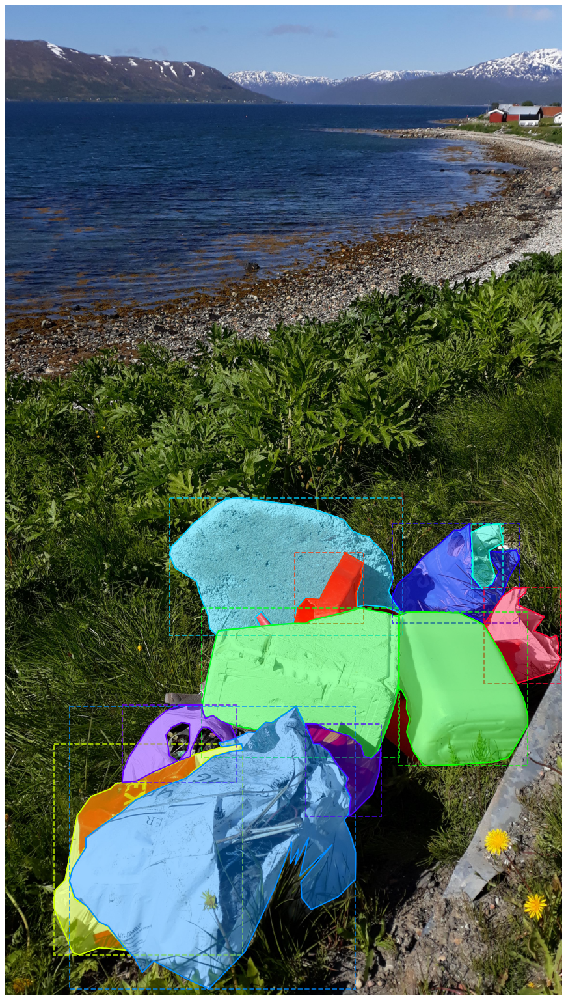

In [8]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
image_filepath = 'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)
    print (poly)
    plt.show()



Filtrar categorías de las imágenes

In [12]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab
import canvas

# User settings
nr_img_2_display = 10
category_name = 'Clear plastic bottle'#  --- Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds) #hace una mezcla de las identidades para que salgan unas imagenes aleatorias
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)]) #capta los datos de las imagenes seleccionadas aleatoriamente

for img in imgs:
    image_path = dataset_path + '/' + img['file_name'] #filename es el nombre de la imagen tal cual como esta en el archivo
    # Load image
    #I = Image.open(image_path) #aqui se abre la imagen
    I = cv2.imread(image_path)
    resizex = 1024
    resizey = 1024
    resized = cv2.resize(I, (resizex, resizey))
    
    # Load and process image metadata 
    '''if I._getexif():
        exif = dict(I._getexif().items()) #exif=formato de archivo de la imagen
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)'''
    # Show image
    '''fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(resized)'''
    
    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    #print(int(anns_sel['bbox']))
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)#para escoger el color (en este caso aleatorio)
        cont2 = 0
        for seg in ann['segmentation']: #genera el poligono del objeto y ann[segmentation] son las anotaciones del poligono
            resizedseg = []
            for coordenate in seg:
                if cont2 % 2 == 0:
                    coordx = int(coordenate*resizex/(img['width']))
                else:
                    coordy = int(coordenate*resizey/(img['height']))
                    resizedseg.append([coordx, coordy])                               
            #para que se cierre el poligono       
                isClosed = False                      
                poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
                cont2+=1
            image = cv2.polylines(resized, [np.array(resizedseg)],isClosed, color, 2)
            print(resizedseg)
        #interpolacion    
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            print(p)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            print(p)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox'] #esquinas de la boundary box
        agran = x + w
        bgran = y +h
        #interpolacion
        xgran = int(agran*resizex/(img['width']))
        ygran = int(bgran*resizey/(img['height']))
        
        a = int(x*resizex/(img['width']))
        b = int(y*resizey/(img['height']))
        start_point = (a,b)
        end_point = (xgran, ygran)
        thickness = 2
        cv2.rectangle(resized, start_point, end_point, color , thickness)
        '''rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')''' #w y h son el ancho y el alto
        #ax.add_patch(rect) #añade la boundarybox
    #print (anns_sel)
    cv2.imshow('hola',resized)
    cv2.waitKey()
cv2.destroyAllWindows()
#plt.show()


loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
Number of images found:  225
[[316, 306], [384, 276], [393, 274], [400, 271], [416, 262], [435, 253], [449, 246], [462, 245], [472, 246], [481, 250], [487, 252], [494, 249], [500, 249], [504, 263], [502, 271], [496, 275], [488, 293], [475, 309], [464, 315], [434, 329], [420, 336], [411, 333], [405, 341], [393, 349], [374, 356], [358, 365], [340, 372], [330, 376], [324, 362], [320, 341], [315, 327], [313, 309], [316, 306]]
[[776, 959], [784, 945], [788, 912], [791, 888], [805, 872], [810, 863], [825, 850], [848, 839], [862, 870], [851, 888], [836, 923], [829, 944], [823, 961], [807, 967], [799, 976], [789, 976], [776, 959]]
[[410, 484], [428, 479], [451, 477], [495, 480], [518, 484], [555, 490], [574, 487], [595, 490], [620, 491], [638, 495], [576, 536], [526, 533], [483, 537], [476, 538], [468, 537], [435, 544], [430, 554], [436, 561], [444, 563], [460, 575], [474, 577], [491, 583], [503, 585], [482, 603

# Guardar imagenes

In [9]:
RUTA_IMAGENES = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','imagenesguardadas')
print(RUTA_IMAGENES)
print(dataset_path)

Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas
./TACO/data


In [10]:
if not os.path.exists(RUTA_IMAGENES): #hace los directorios para las imagenes y para los conjuntos
    !mkdir {RUTA_IMAGENES}
'''for conjunto in conjuntos:
    RUTA_CONJUNTOS = os.path.join(RUTA_IMAGENES, conjunto)
    if not os.path.exists(conjunto):
        !mkdir {RUTA_CONJUNTOS}'''

'for conjunto in conjuntos:\n    RUTA_CONJUNTOS = os.path.join(RUTA_IMAGENES, conjunto)\n    if not os.path.exists(conjunto):\n        !mkdir {RUTA_CONJUNTOS}'

# Crear una ruta para cada conjunto

In [11]:
RUTA_BOTELLAS = os.path.join(RUTA_IMAGENES, 'Botellas')
#RUTA_TAPONES = os.path.join(RUTA_IMAGENES, 'Tapones')

if not os.path.exists(conjuntos[0]):
    !mkdir {RUTA_BOTELLAS}
#if not os.path.exists(conjuntos[1]):
#    !mkdir {RUTA_TAPONES}
ruta_conjunto = [RUTA_BOTELLAS]
nombre_carpeta = ['Botellas']
nombre_conjunto = ['Clear_plastic_bottle']

Ya existe el subdirectorio o el archivo Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas.


### Guardar las imagenes para Faster RCNN

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.ca973fb7-288c-11ed-b616-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.caa6a316-288c-11ed-86e4-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cab5491f-288c-11ed-9e98-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cb078f88-288c-11ed-88eb-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cb37790a-288c-11ed-bdf6-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cb492c3c-288c-11ed-a876-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cb5b7be6-288c-11ed-8f85-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesgu

C:\Users\DANIEL\AppData\Local\Temp\ipykernel_16440\698491681.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1)


Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.ccbc7c79-288c-11ed-90e5-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.ccd35fd8-288c-11ed-82d5-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.ccf16f10-288c-11ed-bdf4-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cd05e2d1-288c-11ed-8593-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cd20e388-288c-11ed-8e74-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cd333307-288c-11ed-991e-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cd4bff2a-288c-11ed-beb1-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.cd68ea2b-288c-11ed-b377-309c23179b39
Tensorfl

Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d37f7985-288c-11ed-aea3-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d39ec1c5-288c-11ed-b523-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d3aec75a-288c-11ed-9531-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d3c8b803-288c-11ed-a940-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d3e750da-288c-11ed-9adc-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d3ff6cac-288c-11ed-85fb-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d41cdfc7-288c-11ed-8eea-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.d43ec1e7-288c-11ed-b286-309c23179b39
Tensorfl

Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dbde5eeb-288c-11ed-97fa-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dbf59068-288c-11ed-afa3-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dc13edd8-288c-11ed-b46b-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dc42ed61-288c-11ed-918c-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dc64f446-288c-11ed-8b4d-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dc9e7838-288c-11ed-84ba-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dcbe0e2c-288c-11ed-8380-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.dcde8e86-288c-11ed-938c-309c23179b39
Tensorfl

Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.e4a9caeb-288c-11ed-979f-309c23179b39
Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\Botellas\Clear_plastic_bottle.e4c0ae7c-288c-11ed-b383-309c23179b39
Number of images found:  225


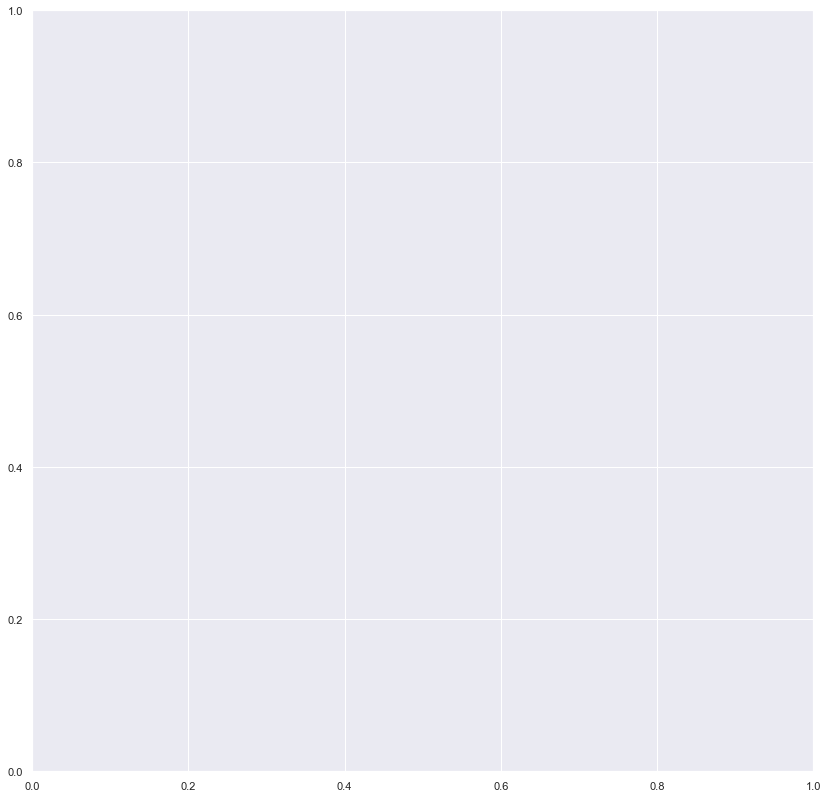

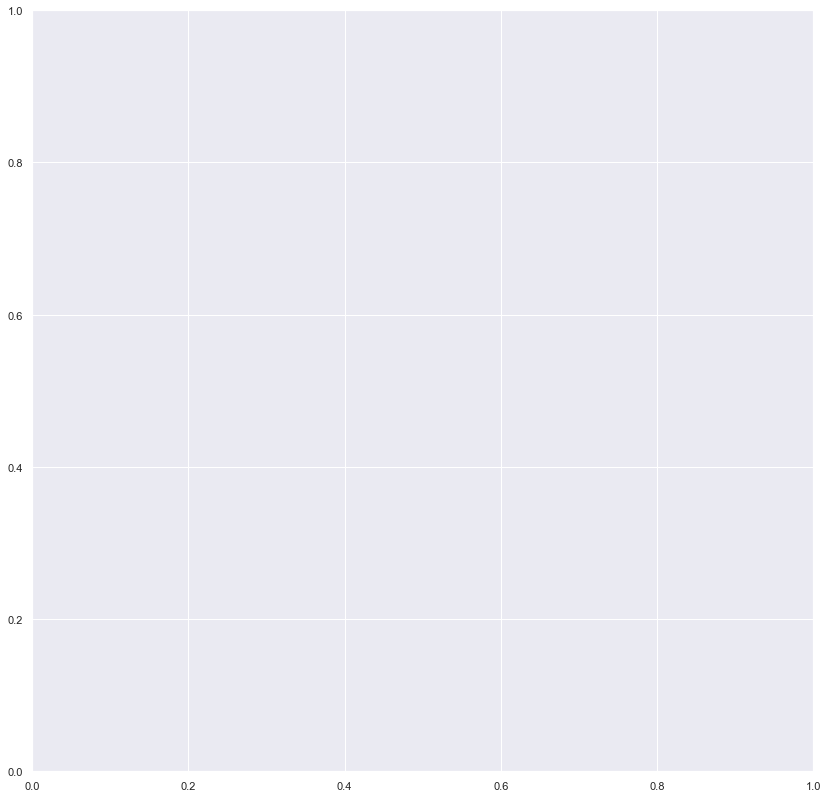

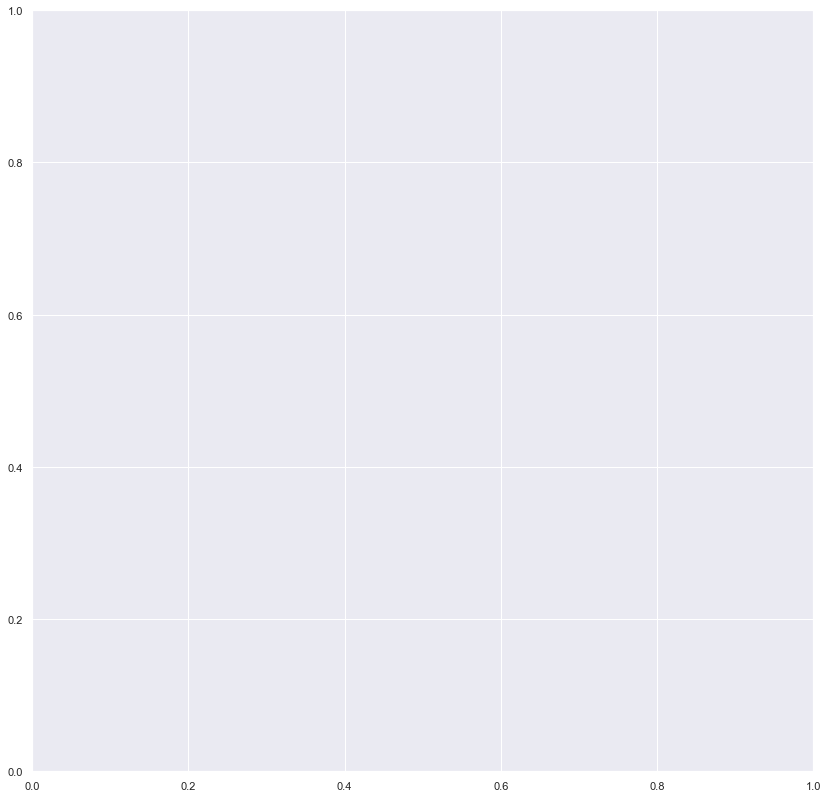

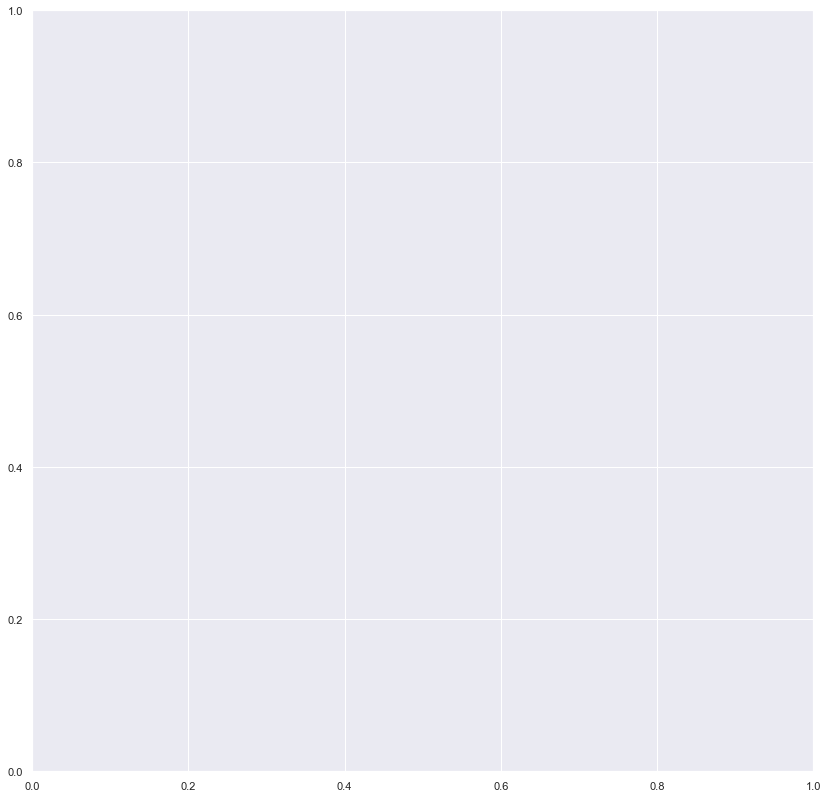

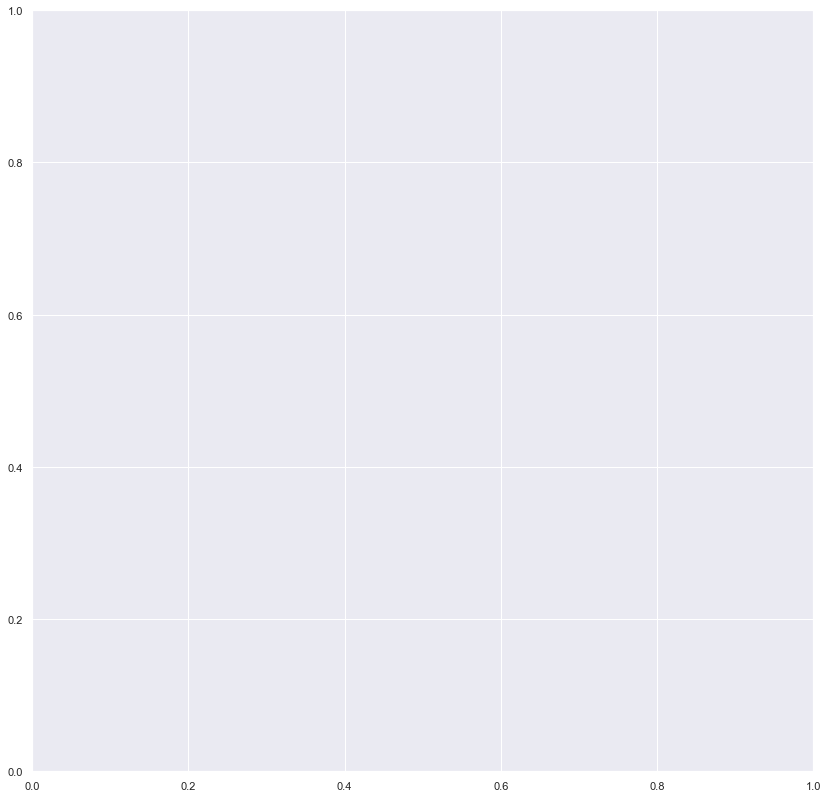

...

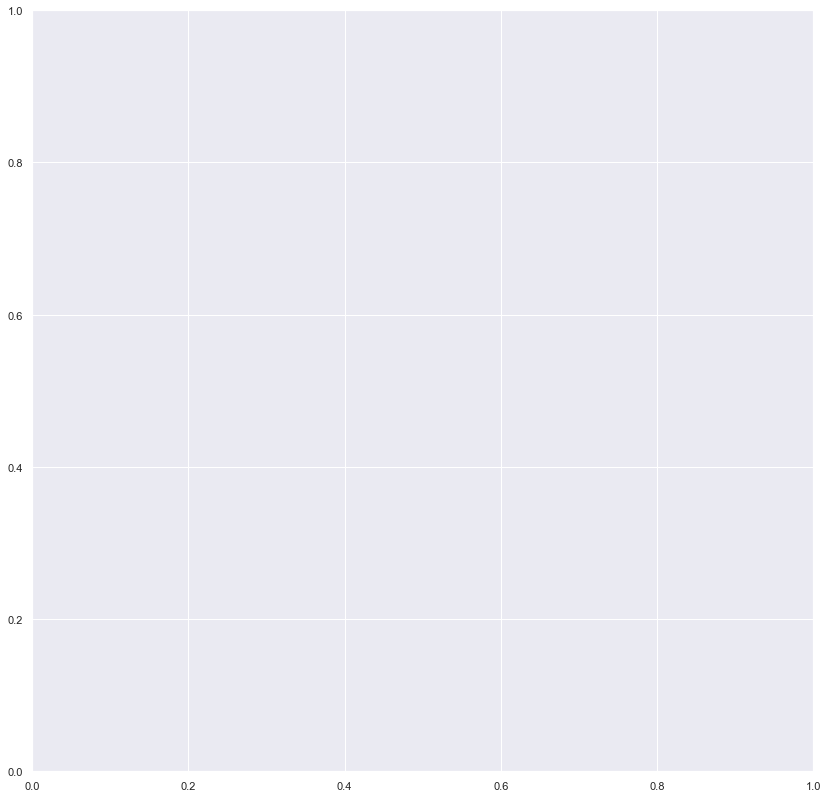

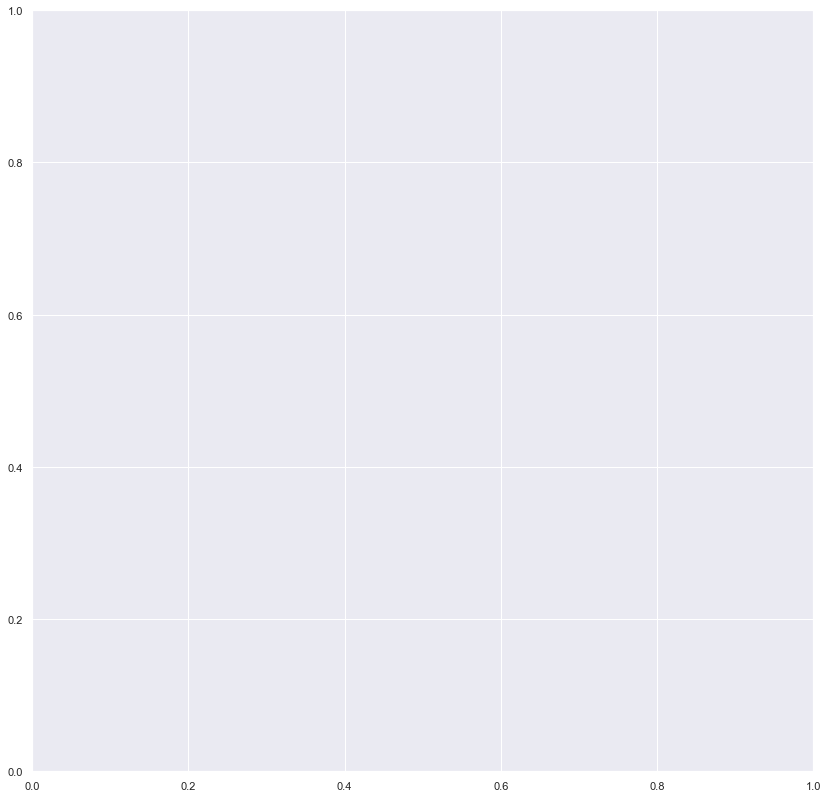

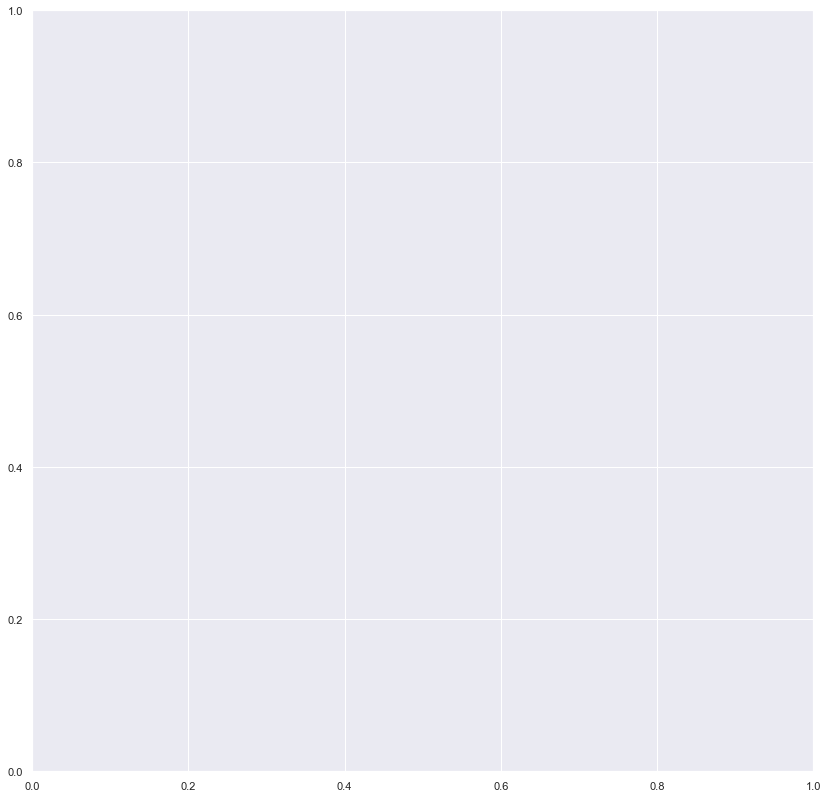

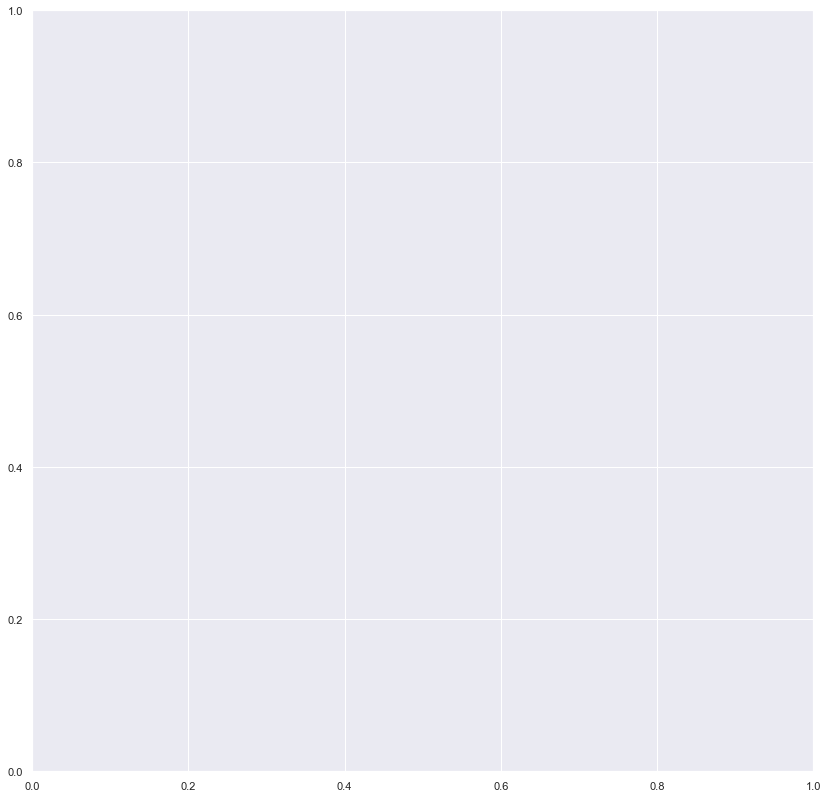

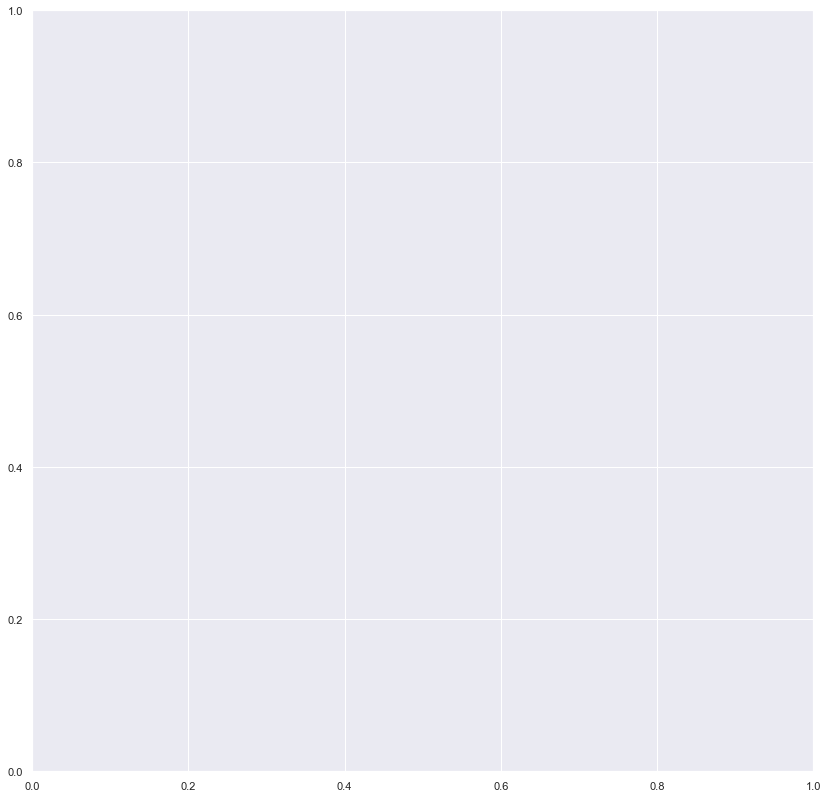

In [12]:
import xml.etree.ElementTree as ET
from xml.etree.ElementTree import ElementTree, tostring
cont=0
for conjunto in conjuntos:
    category_name = conjunto
    pylab.rcParams['figure.figsize'] = (14,14)
    # Obtain Exif orientation tag code
    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break
    # Loads dataset as a coco object
    coco = COCO(anns_file_path)
    
    
    # Get image ids
    imgIds = []
    # Get image ids
    imgIds = []
    catIds = coco.getCatIds(catNms=[category_name])
    if catIds:
        # Get all images containing an instance of the chosen category
        imgIds = coco.getImgIds(catIds=catIds)
    else:
        # Get all images containing an instance of the chosen super category
        catIds = coco.getCatIds(supNms=[category_name]) #recoge las imagenes de la categoria especifica
        for catId in catIds:
            imgIds += (coco.getImgIds(catIds=catIds))
        imgIds = list(set(imgIds))
    nr_images_found = len(imgIds)
    num_imagenes_pantalla = 5
    imgs = coco.loadImgs(imgIds[0:min(nr_images_found,nr_images_found)])
    
    
    for img in imgs:
        imgIds += (coco.getImgIds(catIds=catIds))
        image_path = dataset_path + '/' + img['file_name']
        I = cv2.imread(image_path)
        resizex = 1024
        resizey = 1024
        resized = cv2.resize(I, (resizex, resizey))
        fig,ax = plt.subplots(1)
        file_name2 = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        file_name= file_name2 + '.jpg'
        NEW_PATH = os.path.join(ruta_conjunto[cont],file_name2)
        print(NEW_PATH)
        new_image_path = os.path.join(NEW_PATH + '.jpg')
        cv2.imwrite(new_image_path, resized)
        
        #Cargar notas de las mascaras
        
        #Cargar width,height, ruta, category?
        
        annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
        anns_sel = coco.loadAnns(annIds)
        for ann in anns_sel:
            alto = str(resizex)
            ancho = str(resizey)
            RUTA_ANNOTATIONS = os.path.join(NEW_PATH + '.xml')

            depth_color = 3 #porque es RGB (3 colores)
            annotation = ET.Element('annotation')
            ET.SubElement(annotation, 'folder').text = f'{nombre_carpeta[cont]}'
            ET.SubElement(annotation, 'filename').text = f'{file_name}'
            ET.SubElement(annotation, 'path').text = f'{ruta_conjunto[cont]}'
            source = ET.SubElement(annotation,'source')
            ET.SubElement(source, 'database').text = 'COCO dataset'
            size = ET.SubElement(annotation,'size')
            ET.SubElement(size, 'width').text = f'{alto}'
            ET.SubElement(size, 'height').text = f'{ancho}'
            ET.SubElement(size, 'depth').text = f'{depth_color}'
            resizedseg2 = []
            for seg in ann['segmentation']:
                resizedseg = []
                cont2 = 0
                for coordenate in seg:
                    if cont2 % 2 == 0:
                        coordx = int(coordenate*resizex/(img['width']))
                    else:
                        coordy = int(coordenate*resizey/(img['height']))
                        resizedseg.append([coordx, coordy])
                    '''image = cv2.polylines(resized, [np.array(resizedseg)],False, (0,0,255), 2)'''
                    cont2+=1
            resizedseg2 = str(resizedseg)
            ET.SubElement(annotation, 'segmented').text = f'{resizedseg2}' 



            object = ET.SubElement(annotation,'object')
            nombre = str(nombre_conjunto[cont])
            ET.SubElement(object, 'name').text = f'{nombre}'
            ET.SubElement(object, 'pose').text = 'Unspecified'
            ET.SubElement(object, 'truncated').text = '0'
            ET.SubElement(object, 'difficult').text = '0'
            bndbox = ET.SubElement(object,'bndbox')
            [x, y, w, h] = ann['bbox']

            agran = x + w
            bgran = y +h
            #interpolacion
            xgran = str(int(agran*resizex/(img['width'])))
            ygran = str(int(bgran*resizey/(img['height'])))

            a = str(int(x*resizex/(img['width'])))
            b = str(int(y*resizey/(img['height'])))


            ET.SubElement(bndbox, 'xmin').text = a
            ET.SubElement(bndbox, 'ymin').text = b
            ET.SubElement(bndbox, 'xmax').text = xgran
            ET.SubElement(bndbox, 'ymax').text = ygran

            '''xgran = int(agran*resizex/(img['width']))
            ygran = int(bgran*resizey/(img['height']))      
            a = int(x*resizex/(img['width']))
            b = int(y*resizey/(img['height']))
            start_point = (a,b)
            end_point = (xgran, ygran)
            thickness = 2
            cv2.rectangle(resized, start_point, end_point, (0,0,255) , thickness)
            cv2.imshow('hola',resized)
            cv2.waitKey()
            cv2.destroyAllWindows()'''

            archivo = ET.ElementTree(annotation)
            archivo.write(NEW_PATH + '.xml')        
    print('Number of images found: ',nr_images_found)    
    cont+=1


## Guardar imagenes para mask rcnn

In [ ]:
import codecs
import json
import io
import base64
import PIL
cont=0
for conjunto in conjuntos:
    category_name = conjunto
    pylab.rcParams['figure.figsize'] = (14,14)
    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break
    coco = COCO(anns_file_path)    
    # Get image ids
    imgIds = []
    catIds = coco.getCatIds(catNms=[category_name])
    if catIds:
        # Get all images containing an instance of the chosen category
        imgIds = coco.getImgIds(catIds=catIds)
    else:
        # Get all images containing an instance of the chosen super category
        catIds = coco.getCatIds(supNms=[category_name]) #recoge las imagenes de la categoria especifica
        for catId in catIds:
            imgIds += (coco.getImgIds(catIds=catIds))
        imgIds = list(set(imgIds))
    nr_images_found = len(imgIds)
    num_imagenes_pantalla = 5
    imgs = coco.loadImgs(imgIds[0:min(nr_images_found,nr_images_found)])
    
    # Select N random images
    
    nr_img_2_display = 5
    random.shuffle(imgIds) #hace una mezcla de las identidades para que salgan unas imagenes aleatorias
    imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)]) #capta los datos de las imagenes seleccionadas aleatoriamente

    
    for img in imgs:
        DICCIONARIO = {}
        imgIds += (coco.getImgIds(catIds=catIds))
        image_path = dataset_path + '/' + img['file_name']
        I = cv2.imread(image_path)
        resizex = 800
        resizey = 600
        resized = cv2.resize(I, (resizex, resizey))
        fig,ax = plt.subplots(1)
        file_name2 = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        file_name= file_name2 + '.jpg'
        NEW_PATH = os.path.join(ruta_conjunto[cont],file_name2)
        new_image_path = os.path.join(NEW_PATH + '.jpg')
        DICCIONARIO['version'] = '4.2.9' #version actual de labelme
        DICCIONARIO['flags'] = {}
        FORMAS = {}
        DICCIONARIO['shapes'] = [FORMAS]        
        FORMAS['label'] = nombres_variables[cont]
        
        cv2.imwrite(new_image_path, resized)
        #Cargar notas de las mascaras
        
        #Cargar width,height, ruta, category?
        def encodeImageForJson(image):
            img_pil = PIL.Image.fromarray(image, mode='RGB')
            f = io.BytesIO()
            img_pil.save(f, format='PNG')
            data = f.getvalue()
            encData = codecs.encode(data, 'base64').decode()
            encData = encData.replace('\n', '')
            return encData
        
        
        annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
        anns_sel = coco.loadAnns(annIds)
        for ann in anns_sel:
            alto = str(resizex)
            ancho = str(resizey)
            RUTA_ANNOTATIONS = os.path.join(NEW_PATH + '.xml')

            depth_color = 3 #porque es RGB (3 colores)
            resizedseg2 = []
            for seg in ann['segmentation']:
                resizedseg = []
                cont2 = 0
                for coordenate in seg:
                    if cont2 % 2 == 0:
                        coordx = float(coordenate*resizex/(img['width']))
                    else:
                        coordy = float(coordenate*resizey/(img['height']))
                        resizedseg.append([coordx,coordy])
                    #image = cv2.polylines(resized, [np.array(resizedseg)],False, (0,0,255), 2)
                    cont2+=1
            FORMAS['points'] = resizedseg
            FORMAS['group_id'] = 'null'
            FORMAS['shape_type'] = 'polygon'
            FORMAS['flags'] = {}
            DICCIONARIO['imagePath'] = file_name            

            DICCIONARIO['imageData'] = encodeImageForJson(resized)
            DICCIONARIO['imageHeight'] = alto
            DICCIONARIO['imageWidth'] = ancho
            archivo = NEW_PATH + '.json'
            with open(archivo,'w') as file:
                json.dump(DICCIONARIO, file)
            
            nombre = str(nombre_conjunto[cont])
            [x, y, w, h] = ann['bbox']
            agran = x + w
            bgran = y +h
            #interpolacion
            xgran = str(int(agran*resizex/(img['width'])))
            ygran = str(int(bgran*resizey/(img['height'])))

            a = str(int(x*resizex/(img['width'])))
            b = str(int(y*resizey/(img['height'])))

            xgran = int(agran*resizex/(img['width']))
            ygran = int(bgran*resizey/(img['height']))      
            a = int(x*resizex/(img['width']))
            b = int(y*resizey/(img['height']))
            start_point = (a,b)
            end_point = (xgran, ygran)
            print(start_point, end_point)
            '''thickness = 2
            cv2.rectangle(resized, start_point, end_point, (0,0,255) , thickness)
            cv2.imshow('hola',resized)
            cv2.waitKey()
            cv2.destroyAllWindows()'''
        
        
        
        
    print('Number of images found: ',nr_images_found)    
    cont+=1

## Guardar imagenes para mascara personal

In [11]:
RUTA_IMAGENES_TRAIN = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','train')
RUTA_IMAGENES_TEST = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','test')


In [ ]:
archivotrain = os.path.join(RUTA_IMAGENES_TRAIN, 'train.json')
archivotest = os.path.join(RUTA_IMAGENES_TEST, 'test.json')
DICCIONARIOTRAIN = {}
DICCIONARIOTEST = {}
import codecs
import json
import io
import base64
import PIL
cont=0
for conjunto in conjuntos:
    
    category_name = conjunto
    pylab.rcParams['figure.figsize'] = (14,14)
    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break
    coco = COCO(anns_file_path)    
    # Get image ids
    imgIds = []
    catIds = coco.getCatIds(catNms=[category_name])
    if catIds:
        # Get all images containing an instance of the chosen category
        imgIds = coco.getImgIds(catIds=catIds)
    else:
        # Get all images containing an instance of the chosen super category
        catIds = coco.getCatIds(supNms=[category_name]) #recoge las imagenes de la categoria especifica
        for catId in catIds:
            imgIds += (coco.getImgIds(catIds=catIds))
        imgIds = list(set(imgIds))
    nr_images_found = len(imgIds)
    nr_img_2_display = nr_images_found
    #imgs = coco.loadImgs(imgIds[0:min(nr_images_found,nr_images_found)])
    
    # Select N random images   
    #random.shuffle(imgIds) #hace una mezcla de las identidades para que salgan unas imagenes aleatorias
    imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)]) #capta los datos de las imagenes seleccionadas aleatoriamente

    cont2=1
    NUMBER_CHANGE_TO_TRAIN=int(nr_img_2_display*0.8)
    for img in imgs:
        
        imgIds += (coco.getImgIds(catIds=catIds))
        image_path = dataset_path + '/' + img['file_name']
        I = cv2.imread(image_path)
        resizex = int(img['width']/4)
        resizey = int(img['height']/4)
        resized = cv2.resize(I, (resizex, resizey))
        fig,ax = plt.subplots(1)
        file_name2 = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        file_name= file_name2 + '.jpg'
        if 0<=cont2<=NUMBER_CHANGE_TO_TRAIN:
            IMAGE_RUTA = os.path.join(RUTA_IMAGENES_TRAIN, file_name)
        else:
            IMAGE_RUTA = os.path.join(RUTA_IMAGENES_TEST, file_name)
        
        cv2.imwrite(IMAGE_RUTA, resized)

        DICCIONARIO = {}
        nombreimagen = file_name+str(resizex*resizey)
        nombre_imagen = {}
        DICCIONARIO[nombreimagen] = nombre_imagen
        nombre_imagen['filename'] = file_name
        nombre_imagen['size'] = resizex*resizey
        REGIONES = {}
        VARIOSOBJETOS = []
        nombre_imagen['regions'] = VARIOSOBJETOS
        
        annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
        anns_sel = coco.loadAnns(annIds)
        for ann in anns_sel:
            
            FORMAS = {}
            REGIONES['shape_attributes'] = FORMAS
            FORMAS['name'] = 'polygon'        
        
            alto = str(resizex)
            ancho = str(resizey)
            depth_color = 3 #porque es RGB (3 colores)
            xcoordenates = []
            ycoordenates = []
            for seg in ann['segmentation']:
                resizedseg = []
                cont3 = 0
                for coordenate in seg:
                    if cont3 % 2 == 0:
                        coordx = int(coordenate*resizex/(img['width']))
                        xcoordenates.append(coordx)
                    else:
                        coordy = int(coordenate*resizey/(img['height']))
                        ycoordenates.append(coordy)
                    cont3+=1
            FORMAS['all_points_x'] = xcoordenates
            FORMAS['all_points_y'] = ycoordenates
            REGION = {}
            REGIONES['region_attributes'] = REGION
            REGION['rubbish'] = nombre_conjunto[cont]
            
            VARIOSOBJETOS.append(REGIONES)
            fileattrib={}
            nombre_imagen['fileattributes'] = fileattrib
        if 0<=cont2<=NUMBER_CHANGE_TO_TRAIN:
            DICCIONARIOTRAIN.update(DICCIONARIO)
        else:
            DICCIONARIOTEST.update(DICCIONARIO)
        cont2+=1
        
    print('Number of images found: ',nr_images_found)    
    cont+=1
with open(archivotrain,'w') as file:
    json.dump(DICCIONARIOTRAIN, file)
with open(archivotest,'w') as file:
    json.dump(DICCIONARIOTEST, file)

## RECOPILACION IMAGENES Y JSON 1 A 1

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


C:\Users\DANIEL\AppData\Local\Temp\ipykernel_2612\1988563034.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1)


Number of images found:  225


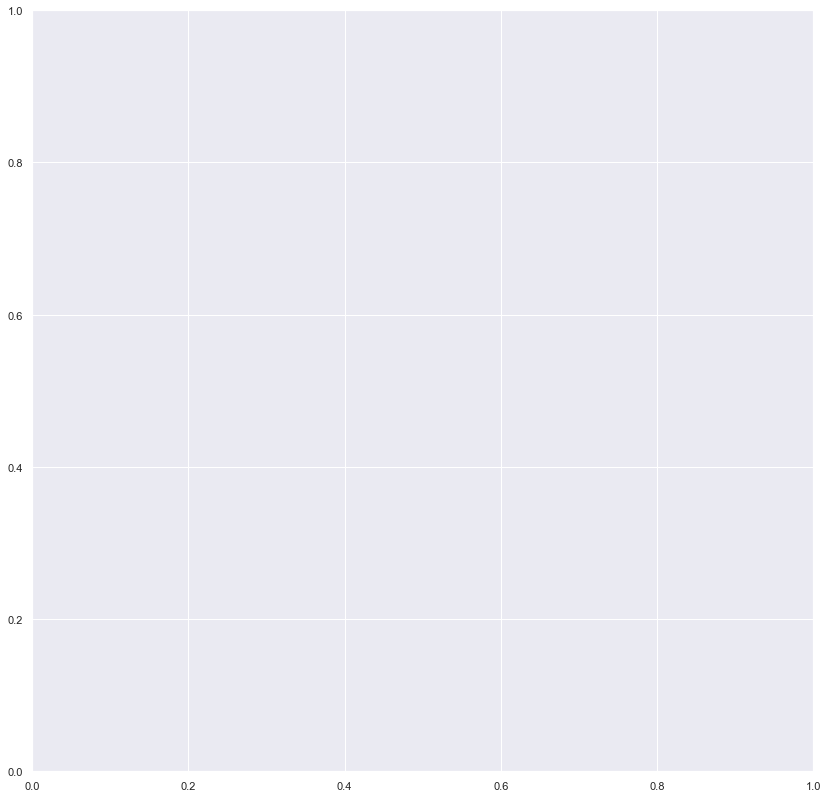

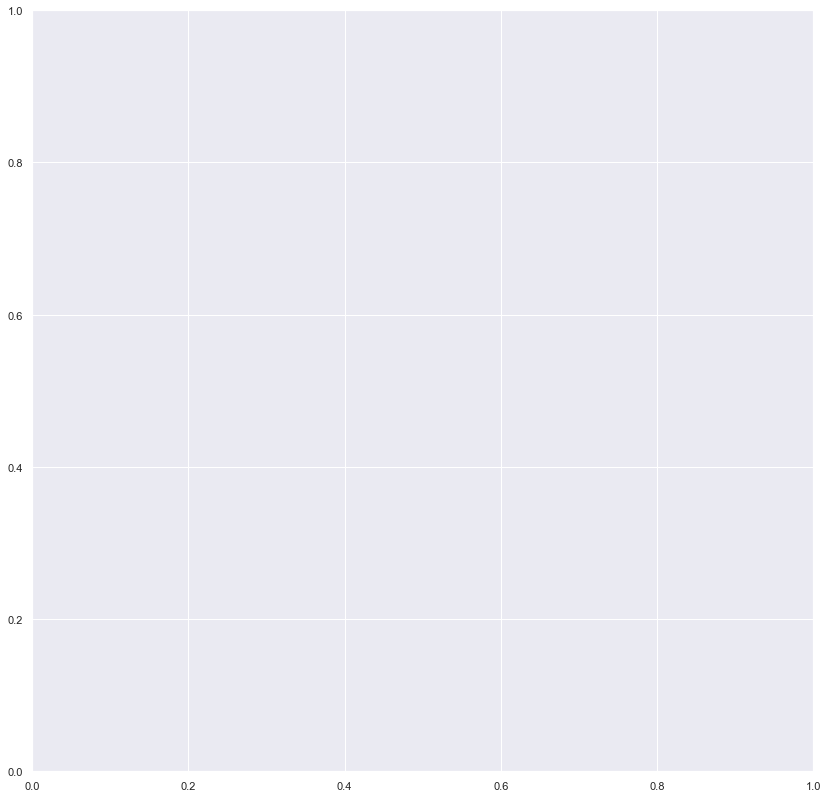

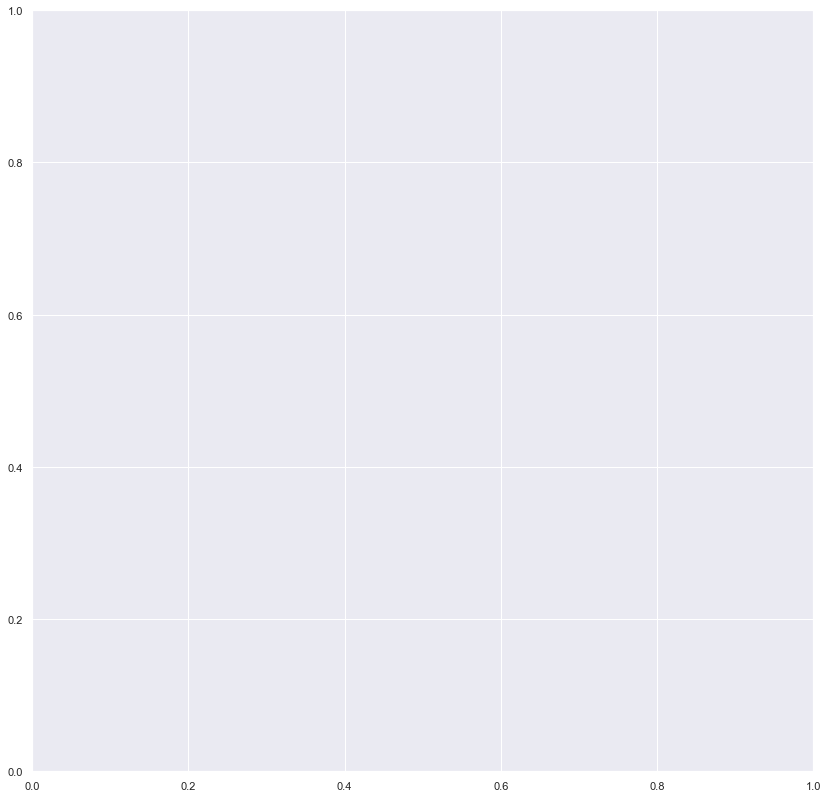

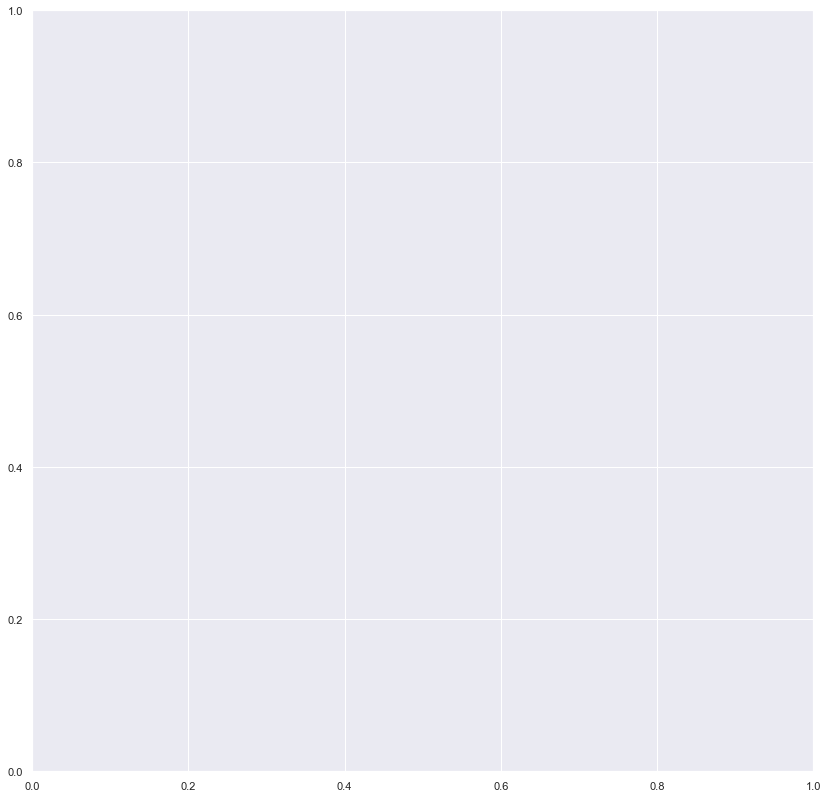

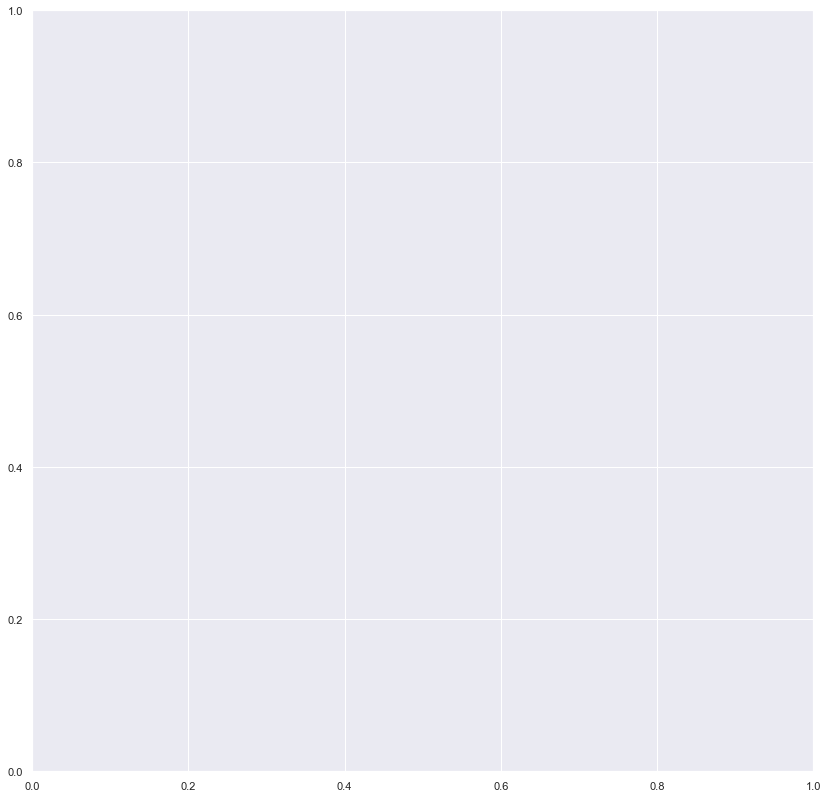

...

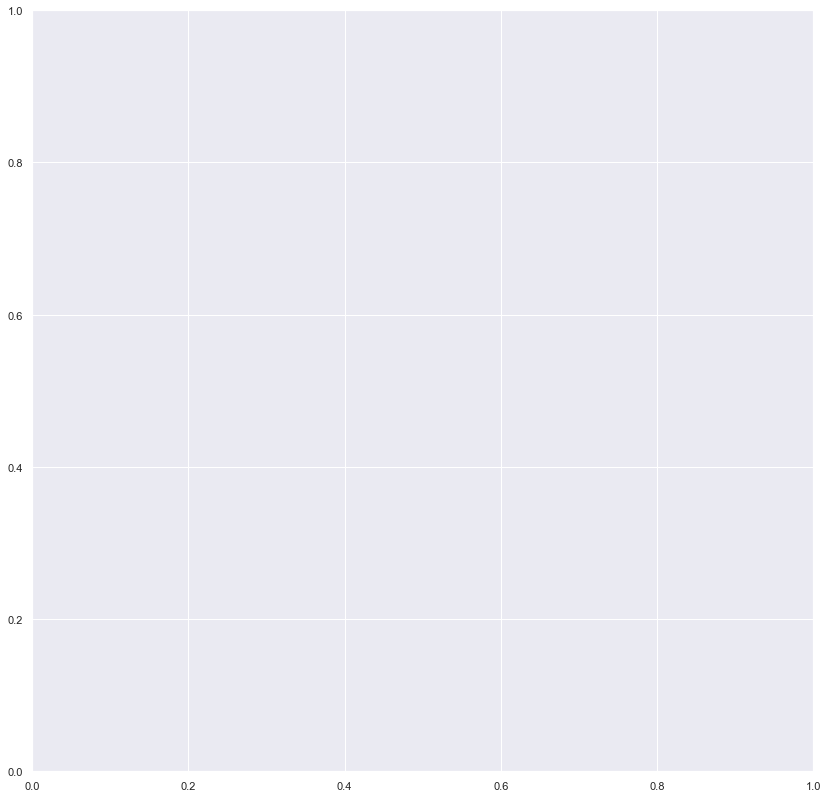

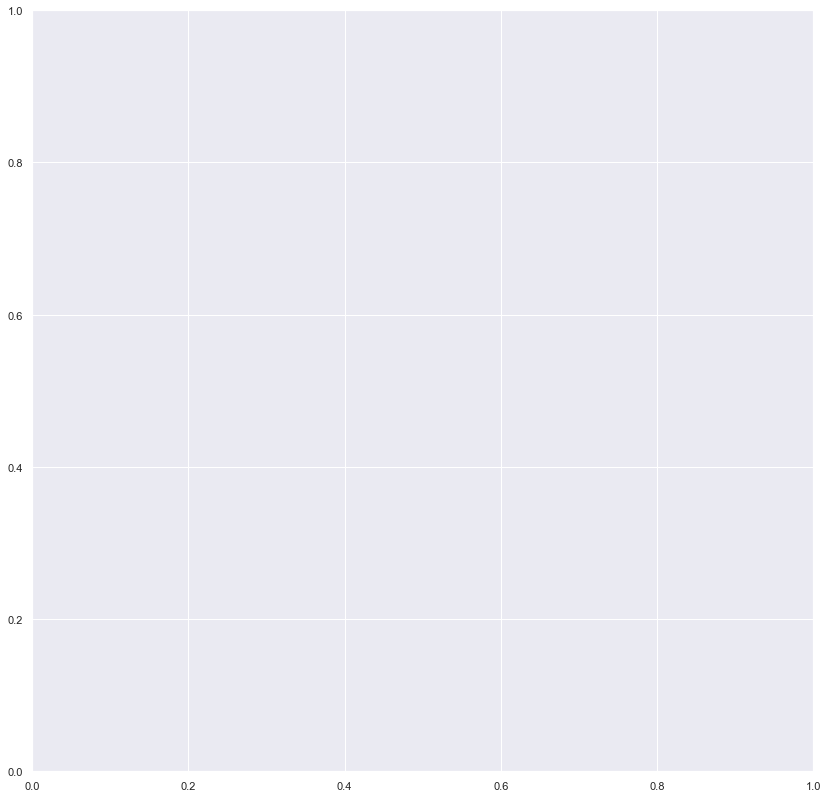

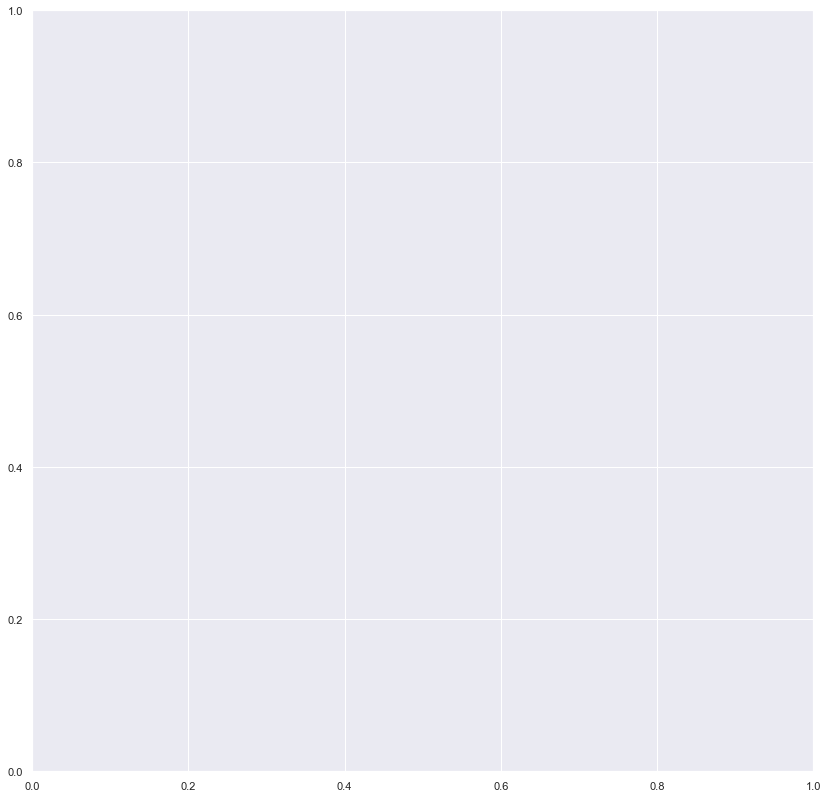

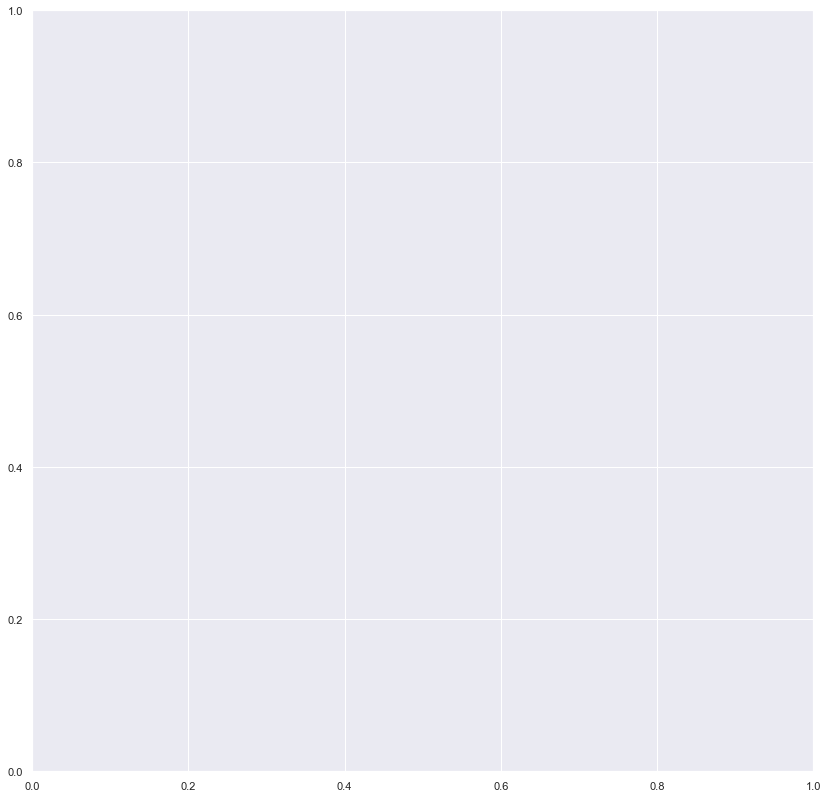

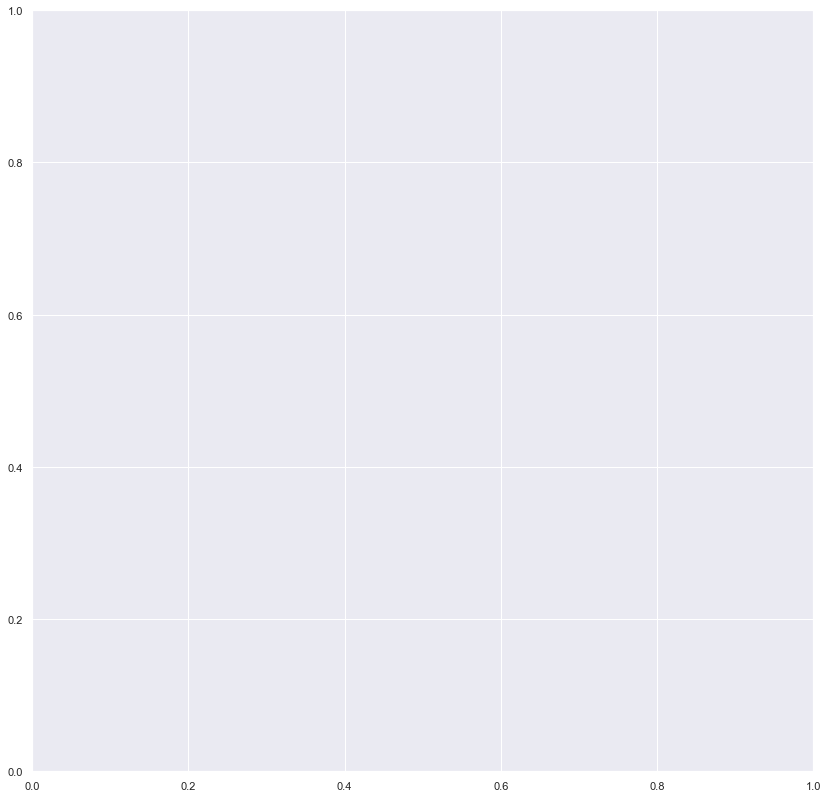

In [12]:
import codecs
import json
import io
import base64
import PIL
def encodeImageForJson(image):
            img_pil = PIL.Image.fromarray(image, mode='RGB')
            f = io.BytesIO()
            img_pil.save(f, format='PNG')
            data = f.getvalue()
            encData = codecs.encode(data, 'base64').decode()
            encData = encData.replace('\n', '')
            return encData
cont=0
for conjunto in conjuntos:
    category_name = conjunto
    pylab.rcParams['figure.figsize'] = (14,14)
    for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break
    coco = COCO(anns_file_path)    
    # Get image ids
    imgIds = []
    catIds = coco.getCatIds(catNms=[category_name])
    if catIds:
        # Get all images containing an instance of the chosen category
        imgIds = coco.getImgIds(catIds=catIds)
    else:
        # Get all images containing an instance of the chosen super category
        catIds = coco.getCatIds(supNms=[category_name]) #recoge las imagenes de la categoria especifica
        for catId in catIds:
            imgIds += (coco.getImgIds(catIds=catIds))
        imgIds = list(set(imgIds))
    nr_images_found = len(imgIds)
    num_imagenes_pantalla = 5
    imgs = coco.loadImgs(imgIds[0:min(nr_images_found,nr_images_found)])
    
    # Select N random images
    
    nr_img_2_display = nr_images_found
    random.shuffle(imgIds) #hace una mezcla de las identidades para que salgan unas imagenes aleatorias
    imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)]) #capta los datos de las imagenes seleccionadas aleatoriamente

    
    for img in imgs:
        
        imgIds += (coco.getImgIds(catIds=catIds))
        image_path = dataset_path + '/' + img['file_name']
        I = cv2.imread(image_path)
        resizex = int(img['width'])
        resizey = int(img['height'])
        #resizex = 600
        #resizey = 600
        resized = cv2.resize(I, (resizex, resizey))
        fig,ax = plt.subplots(1)
        file_name2 = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        file_name= file_name2 + '.jpg'
        NEW_PATH = os.path.join(ruta_conjunto[cont],file_name2)
        new_image_path = os.path.join(NEW_PATH + '.jpg')
        cv2.imwrite(new_image_path, resized)

        DICCIONARIO = {}
        DICCIONARIO['version'] = '4.2.9' #version actual de labelme
        DICCIONARIO['flags'] = {}
        
        variasimagenes = []


        #Cargar notas de las mascaras

        #Cargar width,height, ruta, category?



        annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
        anns_sel = coco.loadAnns(annIds)
        for ann in anns_sel:
            alto = str(resizex)
            ancho = str(resizey)
            RUTA_ANNOTATIONS = os.path.join(NEW_PATH + '.xml')
            
            depth_color = 3 #porque es RGB (3 colores)
            #resizedseg = []
            for seg in ann['segmentation']:
                FORMAS = {}
                resizedseg = []
                cont2 = 0
                for coordenate in seg:
                    if cont2 % 2 == 0:
                        coordx = float(int(coordenate*resizex/(img['width'])))
                    else:
                        coordy = float(int(coordenate*resizey/(img['height'])))
                        resizedseg.append([coordx,coordy])
                    #image = cv2.polylines(resized, [np.array(resizedseg)],False, (0,0,255), 2)
                    cont2+=1
                FORMAS['label'] = nombre_conjunto[cont]
                FORMAS['line_color']='null'
                FORMAS['fill_color']='null'
                FORMAS['points'] = resizedseg
                FORMAS['group_id'] = 'null'
                FORMAS['shape_type'] = 'polygon'
                variasimagenes.append(FORMAS)
            DICCIONARIO['shapes'] = variasimagenes        
        DICCIONARIO['imagePath'] = file_name
        #DICCIONARIO['imageData'] = encodeImageForJson(resized)
        DICCIONARIO['imageHeight'] = resizey
        DICCIONARIO['imageWidth'] = resizex
        DIRJSON = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','imagenesguardadas', 'botellasjson', file_name2)
        archivo = DIRJSON + '.json'
        with open(archivo,'w') as file:
            json.dump(DICCIONARIO, file)
            
        
        
        
        
    print('Number of images found: ',nr_images_found)    
    cont+=1

In [18]:
import imgaug as ia
from imgaug import augmenters as iaa

def augment_poly(im_path, ann_path, width, height):
    
    im = cv2.imread(im_path)
    #im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    aug_shape_dicts = ann_path
    i = 0
    aug_shape_dicts = []
    points=[]
    
    for shape in ann_path:
        for pairs in shape['points']:
            points.append(ia.Keypoint(x=pairs[0], y=pairs[1]))
        #diccionario para imgaug:
        _d = {}
        _d['index'] = (i, i+len(shape['points']))
        aug_shape_dicts.append(_d)        
        i += len(shape['points'])
    print(height, width)
    keypoints = ia.KeypointsOnImage(points, shape=(width,height,3))
    image_aug = seq_det.augment_images([im])[0]
    keypoints_aug = seq_det.augment_keypoints([keypoints])[0]
    for shape in aug_shape_dicts:
        aug_points=[]
        start, end = shape['index']
        
        #aug_points = [[int(keypoint.x), int(keypoint.y)] for keypoint in keypoints_aug.keypoints[start:end]]
        #shape['points'] = aug_points
        for keypoint in keypoints_aug.keypoints[start:end]:
            if keypoint.x < 0:
                keypoint.x = 0
            if keypoint.x > 600:
                keypoint.x = 600
            if keypoint.y < 0:
                keypoint.y = 0
            if keypoint.y > 600:
                keypoint.y = 600
            puntos = [int(keypoint.x), int(keypoint.y)]
            aug_points.append(puntos)
        shape['points'] = aug_points
    return image_aug, aug_shape_dicts

In [133]:
'''def augment_poly(im_path, ann_path):
    
    im = cv2.imread(im_path, 1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    with open(ann_path) as handle:
        data = json.load(handle)
    
    shape_dicts = data['shapes']
    points = []
    aug_shape_dicts = []
    i = 0
    
    for shape in shape_dicts:
        
        for pairs in shape['points']:
            points.append(ia.Keypoint(x=pairs[0], y=pairs[1]))
        
        _d = {}
        _d['label'] = shape['label']
        _d['index'] = (i, i+len(shape['points']))
        aug_shape_dicts.append(_d)

        i += len(shape['points'])
    
    keypoints = ia.KeypointsOnImage(points, shape=(256,256,3))
    
    image_aug = seq_det.augment_images([im])[0]
    keypoints_aug = seq_det.augment_keypoints([keypoints])[0]
    
    for shape in aug_shape_dicts:
        start, end = shape['index']
        aug_points = [[keypoint.x, keypoint.y] for keypoint in keypoints_aug.keypoints[start:end]]
        shape['points'] = aug_points
    
    return image_aug, aug_shape_dicts'''

"def augment_poly(im_path, ann_path):\n    \n    im = cv2.imread(im_path, 1)\n    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)\n    \n    with open(ann_path) as handle:\n        data = json.load(handle)\n    \n    shape_dicts = data['shapes']\n    points = []\n    aug_shape_dicts = []\n    i = 0\n    \n    for shape in shape_dicts:\n        \n        for pairs in shape['points']:\n            points.append(ia.Keypoint(x=pairs[0], y=pairs[1]))\n        \n        _d = {}\n        _d['label'] = shape['label']\n        _d['index'] = (i, i+len(shape['points']))\n        aug_shape_dicts.append(_d)\n\n        i += len(shape['points'])\n    \n    keypoints = ia.KeypointsOnImage(points, shape=(256,256,3))\n    \n    image_aug = seq_det.augment_images([im])[0]\n    keypoints_aug = seq_det.augment_keypoints([keypoints])[0]\n    \n    for shape in aug_shape_dicts:\n        start, end = shape['index']\n        aug_points = [[keypoint.x, keypoint.y] for keypoint in keypoints_aug.keypoints[start:end]]\n 

In [19]:
'''ia.seed(1)

seq = iaa.Sequential([
    # 1. Flip
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),

    # 2. Affine
    iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, rotate=(-30, 30), scale=(0.5, 1.5)),

    # 3. Multiply
    iaa.Multiply((0.8, 1.2)),

    # 4. Linearcontrast
    iaa.LinearContrast((0.6, 1.4)),

    # Perform methods below only sometimes
    iaa.Sometimes(0.5,
        # 5. GaussianBlur
        iaa.GaussianBlur((0.0, 1.0))
        )
], random_order=True)'''

In [19]:
ia.seed(1)

seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Multiply((1.2, 1.5)),
    iaa.Affine(
        rotate=(-90, 90)
    ),
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 1))
    )
], random_order=True)

In [120]:
'''import codecs
import json
import io
import base64
import PIL
def encodeImageForJson(image):
            img_pil = PIL.Image.fromarray(image, mode='RGB')
            f = io.BytesIO()
            img_pil.save(f, format='PNG')
            data = f.getvalue()
            encData = codecs.encode(data, 'base64').decode()
            encData = encData.replace('\n', '')
            return encData
image_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas'))
annot_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson'))
cont = 0
for conjunto in conjuntos:    
    for i, (im_fn, ann_fn) in enumerate(zip(image_list, annot_list)):

        seq_det = seq.to_deterministic()
        im_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas', im_fn)
        ann_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson', ann_fn)
        with open(ann_path) as handle:
            data = json.load(handle)
        width = int(data['imageWidth'])
        height = int(data['imageHeight'])    
        im_aug, aug_shape_dicts = augment_poly(im_path, data['shapes'], width, height)
        #im = cv2.imread(im_path, 1)

        random_name = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        new_img_path1 = os.path.join('Tensorflow\\espacio_de_trabajo\\imagenes\\imagenesguardadas\\imaug', random_name)
        new_img_path = new_img_path1 + '.jpg'
        new_json_path1 = os.path.join('Tensorflow\\espacio_de_trabajo\\imagenes\\imagenesguardadas\\imaug', random_name)
        new_json_path = new_json_path1 + '.json'
        cv2.imwrite(new_img_path, im_aug)
        datalength = len(data)
        nrshapes = len(data['shapes'])
        print(nrshapes)
        for m in range(nrshapes):
            print(data['shapes'][m]['points'])
            data['shapes'][m]['points'] = aug_shape_dicts[m]['points']
        print(data['shapes']) 
        data['imagePath'] = random_name + '.jpg'
        data['imageData'] = encodeImageForJson(im_aug)
        with open(new_json_path,'w') as file:
            print(data['shapes']) 
            json.dump(data, file)
        if i==21:
            break
    cont += 1'''

"import codecs\nimport json\nimport io\nimport base64\nimport PIL\ndef encodeImageForJson(image):\n            img_pil = PIL.Image.fromarray(image, mode='RGB')\n            f = io.BytesIO()\n            img_pil.save(f, format='PNG')\n            data = f.getvalue()\n            encData = codecs.encode(data, 'base64').decode()\n            encData = encData.replace('\n', '')\n            return encData\nimage_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas'))\nannot_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson'))\ncont = 0\nfor conjunto in conjuntos:    \n    for i, (im_fn, ann_fn) in enumerate(zip(image_list, annot_list)):\n\n        seq_det = seq.to_deterministic()\n        im_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas', im_fn)\n        ann_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson', ann_fn)\n       

In [24]:
import codecs
import json
import io
import base64
import PIL
def encodeImageForJson(image):
            img_pil = PIL.Image.fromarray(image, mode='RGB')
            f = io.BytesIO()
            img_pil.save(f, format='PNG')
            data = f.getvalue()
            encData = codecs.encode(data, 'base64').decode()
            encData = encData.replace('\n', '')
            return encData
image_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas'))
annot_list = sorted(os.listdir('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson'))
cont = 0
for conjunto in conjuntos: 
    nrimg = 0
    for i, (im_fn, ann_fn) in enumerate(zip(image_list, annot_list)):

        seq_det = seq.to_deterministic()
        im_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/Botellas', im_fn)
        ann_path = os.path.join('Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/botellasjson', ann_fn)
        with open(ann_path) as handle:
            data = json.load(handle)
        width = int(data['imageWidth'])
        height = int(data['imageHeight'])    
        im_aug, aug_shape_dicts = augment_poly(im_path, data['shapes'], width, height)
        #im = cv2.imread(im_path, 1)

        random_name = nombre_conjunto[cont] +'.'+format(str(uuid.uuid1()))
        new_img_path1 = os.path.join('Tensorflow\\espacio_de_trabajo\\imagenes\\imagenesguardadas\\imaug', random_name)
        new_img_path = new_img_path1 + '.jpg'
        new_json_path1 = os.path.join('Tensorflow\\espacio_de_trabajo\\imagenes\\imagenesguardadas\\imaug', random_name)
        new_json_path = new_json_path1 + '.json'
        nrshapes = len(data['shapes'])
        if nrshapes == 1:
            cv2.imwrite(new_img_path, im_aug)            
            print(nrshapes)

            data['shapes'][0]['points'] = aug_shape_dicts[0]['points']
            print(data['shapes']) 
            data['imagePath'] = random_name + '.jpg'
            #data['imageData'] = encodeImageForJson(im_aug)
            with open(new_json_path,'w') as file:
                print(data['shapes']) 
                json.dump(data, file)
            nrimg+= 1
    print('number of images = ', nrimg)
    cont += 1

600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[600, 141], [600, 142], [600, 150], [600, 183], [600, 189], [600, 192], [600, 241], [600, 233], [600, 141]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[600, 141], [600, 142], [600, 150], [600, 183], [600, 189], [600, 192], [600, 241], [600, 233], [600, 141]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[247, 264], [292, 276], [346, 295], [358, 300], [371, 311], [379, 320], [392, 328], [399, 330], [401, 329], [412, 334], [412, 338], [408, 347], [397, 344], [395, 344], [394, 342], [383, 340], [369, 340], [353, 343], [341, 343], [331, 340], [280, 324], [274, 322], [239, 308], [230, 306], [222, 305], [211, 302], [199, 296], [192, 289], [192, 286], [194, 283], [192, 281], [194, 274], [197, 272], [200

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[141, 226], [145, 223], [148, 222], [149, 221], [150, 220], [153, 218], [155, 216], [157, 215], [160, 213], [161, 213], [162, 214], [163, 213], [164, 213], [164, 215], [163, 216], [160, 219], [158, 221], [157, 223], [155, 225], [152, 227], [151, 228], [149, 230], [147, 232], [144, 233], [143, 233], [142, 233], [140, 232], [139, 230], [140, 229], [140, 228], [141, 226]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[549, 262], [544, 258], [543, 257], [541, 256], [538, 255], [537, 255], [534, 252], [531, 252], [530, 250], [526, 248], [523, 245], [519, 245], [507, 238], [504, 236], [501, 236], [499, 239], [497, 233], [496, 233], [497, 237], [495, 238], [492, 232], [491, 230], [489, 230], [488, 230], [487, 230], [485, 230], [484, 229], [478, 227], [477, 228], [474, 230], [473, 233], [474, 234], [475, 2

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[210, 307], [213, 288], [216, 278], [221, 268], [226, 255], [227, 250], [231, 234], [234, 227], [237, 219], [242, 212], [245, 210], [248, 209], [252, 208], [255, 212], [259, 214], [261, 215], [264, 213], [267, 212], [270, 211], [275, 213], [278, 215], [284, 225], [287, 230], [290, 232], [295, 238], [296, 243], [296, 255], [293, 261], [293, 269], [293, 279], [293, 289], [292, 306], [291, 327], [289, 336], [287, 347], [285, 354], [283, 362], [277, 370], [264, 386], [252, 391], [246, 394], [243, 407], [242, 411], [237, 411], [232, 409], [224, 404], [221, 400], [222, 398], [230, 398], [241, 399], [245, 400], [245, 396], [243, 394], [243, 395], [237, 395], [231, 394], [226, 395], [222, 393], [223, 389], [223, 386], [225, 384], [224, 382], [218, 373], [212, 359], [209, 349], [243, 353], [256, 355], [264, 356], [273, 357], [278, 357], [284, 357], [285, 354], [284, 353], [263, 352], [231, 348], [218, 346]

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[274, 332], [271, 317], [275, 312], [277, 309], [277, 302], [282, 300], [291, 298], [295, 303], [304, 305], [310, 305], [316, 314], [325, 327], [327, 329], [327, 335], [323, 340], [313, 346], [309, 349], [294, 351], [286, 350], [279, 348], [277, 343]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[240, 313], [236, 302], [227, 284], [224, 279], [218, 271], [214, 271], [204, 276], [204, 279], [208, 282], [213, 294], [225, 309], [228, 315], [228, 316], [224, 315], [229, 328], [238, 343], [243, 353], [251, 357], [257, 366], [262, 361], [260, 355], [257, 351], [257, 341], [254, 333], [247, 326], [244, 320]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[240, 313], [236, 302], [227, 284], [224, 279], [218, 271], [2

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[377, 343], [377, 342], [377, 338], [374, 334], [369, 330], [360, 321], [355, 323], [353, 327], [357, 331], [360, 335], [363, 339], [366, 341], [372, 344], [374, 345], [376, 346], [378, 345], [377, 343]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[266, 307], [275, 314], [284, 325], [278, 331], [271, 348], [261, 362], [256, 374], [250, 383], [243, 395], [235, 404], [227, 410], [218, 418], [201, 428], [190, 435], [188, 439], [192, 440], [188, 442], [182, 451], [174, 452], [165, 450], [158, 448], [156, 446], [161, 439], [160, 439], [159, 439], [161, 434], [162, 433], [164, 434], [166, 429], [164, 423], [161, 409], [160, 395], [163, 385], [164, 381], [170, 371], [183, 354], [187, 348], [193, 339], [200, 327], [202, 323], [208, 319], [216, 312], [229, 307], [239, 304], [250, 303], [261, 305], [266, 3

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[132, 302], [130, 301], [128, 299], [126, 298], [126, 298], [124, 296], [121, 296], [120, 295], [119, 297], [117, 297], [116, 298], [116, 299], [113, 299], [113, 298], [110, 298], [109, 298], [106, 299], [103, 299], [101, 299], [100, 299], [99, 299], [97, 298], [97, 298], [84, 306], [85, 307], [85, 308], [83, 312], [81, 313], [80, 316], [77, 316], [75, 317], [73, 318], [71, 321], [70, 321], [69, 322], [68, 324], [68, 324], [67, 325], [66, 325], [65, 328], [66, 329], [67, 331], [67, 332], [69, 334], [70, 336], [72, 337], [74, 338], [75, 340], [75, 342], [77, 343], [78, 344], [80, 344], [82, 343], [84, 343], [85, 343], [87, 343], [89, 343], [91, 343], [93, 342], [96, 340], [98, 338], [100, 336], [102, 333], [103, 332], [104, 332], [107, 331], [110, 331], [113, 329], [115, 328], [116, 328], [125, 322], [127, 320], [126, 319], [127, 312], [128, 309], [128, 308], [128, 308], [129, 306], [130, 305], [13

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[352, 387], [376, 376], [384, 374], [393, 370], [397, 364], [401, 358], [402, 353], [403, 351], [404, 349], [406, 350], [412, 347], [412, 345], [414, 343], [416, 341], [408, 330], [407, 329], [404, 330], [402, 331], [401, 332], [399, 331], [396, 331], [394, 332], [389, 334], [386, 332], [384, 331], [381, 330], [376, 329], [371, 330], [366, 332], [341, 340], [319, 349], [303, 357], [300, 360], [301, 364], [302, 367], [304, 372], [307, 375], [309, 378], [312, 382], [315, 384], [318, 388], [323, 390], [325, 391], [327, 391], [332, 392], [339, 392], [341, 391], [343, 390], [352, 387]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[246, 585], [222, 574], [216, 569], [211, 570], [185, 559], [179, 551], [181, 542], [184, 539], [189, 540], [194, 539], [195, 537], [190, 534], [184, 532], [190, 522],

1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[278, 275], [275, 274], [274, 274], [272, 274], [268, 273], [265, 273], [263, 273], [262, 274], [260, 275], [258, 274], [257, 275], [257, 276], [258, 277], [261, 278], [262, 279], [262, 280], [266, 281], [271, 281], [273, 280], [277, 281], [278, 281], [280, 281], [282, 281], [282, 279], [281, 278], [281, 277], [281, 276], [280, 275], [278, 275]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[278, 275], [275, 274], [274, 274], [272, 274], [268, 273], [265, 273], [263, 273], [262, 274], [260, 275], [258, 274], [257, 275], [257, 276], [258, 277], [261, 278], [262, 279], [262, 280], [266, 281], [271, 281], [273, 280], [277, 281], [278, 281], [280, 281], [282, 281], [282, 279], [281, 278], [281, 277], [281, 276], [280, 275], [278, 275]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
600 600
1
[{'label':

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[367, 440], [365, 424], [367, 420], [370, 420], [374, 424], [375, 430], [375, 445], [371, 447]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[391, 226], [398, 232], [403, 240], [407, 246], [412, 252], [418, 259], [424, 265], [428, 269], [429, 270], [439, 284], [439, 290], [440, 293], [439, 300], [440, 302], [441, 305], [444, 306], [445, 307], [448, 311], [447, 314], [446, 317], [443, 321], [440, 324], [436, 328], [434, 325], [432, 325], [429, 323], [429, 320], [419, 318], [411, 316], [398, 306], [395, 302], [391, 294], [386, 289], [380, 282], [374, 277], [368, 271], [366, 269], [364, 266], [362, 263], [361, 259], [360, 256], [360, 252], [362, 249], [364, 245], [365, 244], [367, 242], [369, 240], [371, 235], [374, 233], [376, 232], [379, 228], [383, 228], [388, 226], [389, 225], [391, 226]]

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[542, 28], [536, 29], [533, 28], [514, 32], [510, 34], [503, 29], [501, 30], [498, 30], [496, 26], [497, 22], [498, 20], [503, 20], [509, 12], [532, 10], [543, 7], [546, 15], [546, 21]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[366, 258], [371, 260], [375, 267], [379, 271], [384, 278], [378, 288], [373, 294], [366, 299], [362, 297], [361, 294], [357, 297], [356, 292], [354, 291], [353, 286], [349, 281], [346, 278], [355, 271]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[366, 258], [371, 260], [375, 267], [379, 271], [384, 278], [378, 288], [373, 294], [366, 299], [362, 297], [361, 294], [357, 297], [356, 292], [354, 291], [353, 286], [349, 281], [346, 278], [355, 271]], 'group_id': 'null', 'sh

1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[213, 134], [177, 103], [162, 92], [159, 88], [150, 76], [133, 63], [126, 62], [125, 67], [131, 82], [136, 88], [155, 102], [164, 105], [177, 117], [208, 138], [218, 146], [223, 142]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[213, 134], [177, 103], [162, 92], [159, 88], [150, 76], [133, 63], [126, 62], [125, 67], [131, 82], [136, 88], [155, 102], [164, 105], [177, 117], [208, 138], [218, 146], [223, 142]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[185, 270], [188, 276], [192, 282], [193, 285], [195, 288], [196, 289], [197, 290], [198, 292], [200, 294], [202, 296], [204, 295], [207, 295], [209, 294], [211, 296], [212, 296], [218, 293], [224, 290], [229, 288], [233, 284], [238, 280], [243, 276], [247

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[249, 240], [242, 218], [240, 213], [236, 197], [236, 192], [238, 187], [236, 182], [240, 177], [244, 176], [248, 175], [251, 179], [256, 183], [259, 187], [265, 199], [263, 203], [267, 206], [275, 229], [270, 235], [266, 239], [259, 242], [255, 243]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[533, 237], [543, 238], [549, 240], [555, 249], [558, 263], [556, 300], [552, 334], [541, 417], [540, 434], [538, 451], [532, 466], [526, 477], [520, 484], [510, 491], [494, 497], [489, 499], [487, 503], [492, 506], [488, 522], [486, 523], [472, 519], [450, 511], [449, 509], [452, 495], [451, 492], [455, 493], [456, 488], [446, 476], [435, 459], [428, 437], [429, 414], [438, 374], [451, 309], [454, 301], [452, 291], [455, 272], [459, 251], [462, 238], [467, 233], [471, 227], [479, 224], [486, 227], [496, 2

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[163, 403], [162, 392], [162, 384], [160, 369], [156, 345], [156, 336], [158, 325], [160, 317], [162, 311], [164, 305], [164, 302], [161, 302], [161, 296], [162, 294], [162, 292], [161, 292], [161, 286], [167, 282], [171, 280], [176, 278], [180, 278], [180, 281], [181, 282], [181, 285], [181, 286], [182, 286], [183, 290], [184, 291], [182, 295], [183, 296], [189, 301], [192, 304], [195, 309], [198, 314], [201, 316], [202, 323], [204, 328], [205, 330], [213, 360], [215, 365], [217, 372], [218, 377], [220, 383], [222, 393], [223, 398], [226, 404], [228, 408], [227, 412], [224, 418], [219, 428], [213, 434], [206, 440], [204, 441], [201, 444], [189, 446], [185, 446], [180, 444], [172, 437], [166, 431], [168, 423], [166, 416], [165, 411], [163, 403]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[104, 4

600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[317, 392], [330, 393], [338, 391], [378, 392], [404, 393], [419, 393], [432, 391], [450, 386], [460, 381], [474, 380], [481, 368], [472, 367], [466, 368], [463, 365], [454, 362], [443, 365], [445, 362], [432, 359], [392, 363], [369, 364], [353, 363], [336, 362], [327, 364], [313, 369], [310, 375], [301, 386], [304, 391], [311, 392]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[317, 392], [330, 393], [338, 391], [378, 392], [404, 393], [419, 393], [432, 391], [450, 386], [460, 381], [474, 380], [481, 368], [472, 367], [466, 368], [463, 365], [454, 362], [443, 365], [445, 362], [432, 359], [392, 363], [369, 364], [353, 363], [336, 362], [327, 364], [313, 369], [310, 375], [301, 386], [304, 391], [311, 392]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle',

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[253, 65], [253, 88], [250, 115], [245, 134], [241, 165], [238, 173], [235, 178], [232, 189], [217, 184], [219, 170], [213, 156], [214, 145], [214, 130], [212, 109], [214, 77], [218, 55], [229, 49], [238, 49], [242, 50], [248, 56]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[359, 362], [361, 363], [365, 364], [368, 365], [371, 366], [373, 368], [375, 370], [374, 372], [373, 374], [371, 376], [370, 377], [368, 378], [365, 377], [361, 375], [358, 373], [357, 372], [355, 370], [354, 369], [350, 368], [346, 366], [341, 363], [337, 361], [336, 360], [333, 357], [331, 355], [331, 355], [329, 354], [328, 352], [330, 350], [331, 348], [333, 349], [335, 349], [336, 350], [338, 351], [339, 350], [340, 352], [343, 353], [347, 352], [349, 355], [353, 357], [354, 359], [355, 359], [359, 362]], 'group_id': 'n

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[162, 108], [164, 120], [164, 142], [162, 164], [163, 183], [163, 192], [159, 197], [156, 201], [150, 200], [148, 198], [145, 187], [144, 179], [145, 173], [147, 157], [147, 150], [148, 139], [149, 132], [148, 126], [154, 108], [156, 100], [157, 97], [160, 90], [163, 90], [166, 90], [166, 93], [161, 103]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[92, 233], [78, 227], [73, 229], [70, 232], [84, 237], [91, 235]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[92, 233], [78, 227], [73, 229], [70, 232], [84, 237], [91, 235]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[337, 362], [334, 339], [329, 328], [272

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[257, 466], [240, 478], [219, 482], [201, 485], [194, 480], [194, 472], [194, 459], [192, 448], [186, 446], [182, 445], [181, 434], [181, 426], [182, 423], [178, 416], [174, 410], [176, 403], [181, 393], [191, 381], [197, 374], [221, 357], [230, 353], [314, 295], [358, 264], [368, 257], [391, 259], [400, 255], [402, 246], [408, 247], [409, 243], [416, 244], [445, 238], [475, 229], [480, 226], [480, 222], [483, 223], [490, 217], [501, 211], [506, 220], [510, 230], [511, 237], [507, 242], [507, 245], [502, 251], [494, 256], [486, 257], [476, 270], [470, 273], [466, 280], [462, 274], [456, 290], [450, 292], [452, 296], [445, 310], [434, 327], [422, 336], [420, 327], [426, 313], [430, 293], [421, 300], [410, 319], [397, 348], [393, 359], [361, 396], [324, 421], [279, 451], [277, 447], [268, 448], [261, 456]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'l

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[95, 426], [89, 405], [85, 376], [80, 346], [74, 308], [73, 281], [73, 265], [78, 240], [82, 226], [89, 211], [86, 206], [87, 201], [86, 193], [99, 188], [122, 182], [124, 187], [124, 193], [127, 196], [127, 201], [132, 206], [147, 215], [158, 227], [169, 254], [176, 282], [184, 331], [191, 372], [188, 383], [182, 398], [174, 409], [167, 417], [158, 424], [145, 431], [136, 434], [130, 435], [124, 437], [112, 435], [102, 433]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[114, 220], [100, 243], [97, 249], [86, 265], [80, 276], [79, 282], [81, 285], [77, 290], [79, 293], [82, 296], [85, 297], [88, 291], [92, 290], [96, 288], [101, 279], [108, 265], [113, 257], [121, 247], [125, 239], [129, 234], [128, 229], [125, 225], [122, 222], [118, 220]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label':

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[214, 140], [213, 131], [217, 128], [222, 126], [230, 128], [243, 141], [248, 151], [249, 160], [239, 159], [239, 162], [217, 146]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[276, 290], [280, 282], [284, 273], [284, 270], [285, 257], [285, 251], [284, 242], [282, 235], [280, 227], [276, 221], [270, 216], [262, 211], [252, 204], [240, 200], [231, 199], [223, 198], [216, 200], [208, 202], [204, 206], [201, 211], [199, 215], [196, 223], [194, 226], [193, 229], [189, 242], [188, 247], [188, 254], [191, 264], [193, 268], [196, 275], [200, 282], [203, 286], [208, 288], [209, 291], [220, 299], [222, 300], [224, 300], [226, 301], [229, 304], [232, 305], [238, 307], [243, 307], [246, 307], [251, 309], [255, 307], [259, 305], [264, 303], [270, 300], [274, 295], [276, 290]], 'group_id': 'null', 'shape_typ

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[190, 386], [215, 341], [286, 215], [301, 190], [313, 170], [327, 154], [340, 138], [360, 118], [376, 104], [385, 98], [392, 93], [398, 87], [401, 82], [403, 78], [405, 75], [411, 65], [411, 64], [410, 63], [409, 61], [410, 58], [412, 56], [413, 54], [413, 53], [416, 48], [427, 30], [429, 27], [430, 27], [433, 26], [437, 26], [461, 25], [461, 27], [463, 28], [476, 30], [486, 35], [494, 38], [498, 41], [503, 46], [501, 49], [491, 64], [489, 67], [487, 72], [486, 73], [487, 74], [484, 78], [483, 79], [479, 81], [478, 81], [478, 81], [475, 85], [468, 96], [465, 101], [464, 105], [461, 113], [462, 122], [462, 131], [460, 139], [457, 159], [454, 167], [453, 175], [449, 183], [440, 205], [432, 221], [422, 235], [412, 250], [408, 259], [388, 291], [375, 313], [361, 335], [334, 377], [308, 419], [303, 424], [297, 427], [291, 429], [281, 433], [271, 433], [260, 434], [248, 432], [236, 429], [225, 426], [21

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[359, 281], [355, 274], [349, 268], [344, 265], [341, 260], [341, 254], [335, 249], [330, 248], [323, 248], [319, 249], [316, 255], [317, 260], [321, 264], [326, 267], [326, 272], [328, 278], [332, 285], [337, 295], [343, 303], [347, 306], [352, 307], [355, 308], [357, 306], [360, 305], [365, 303], [366, 297], [364, 290], [363, 285], [359, 281]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[171, 139], [182, 132], [187, 126], [202, 118], [206, 115], [210, 115], [216, 109], [227, 105], [237, 105], [247, 101], [259, 93], [277, 94], [296, 103], [307, 112], [319, 130], [326, 143], [338, 163], [349, 181], [368, 200], [407, 239], [412, 245], [425, 263], [429, 266], [429, 270], [431, 272], [434, 273], [436, 282], [438, 287], [441, 290], [444, 297], [454, 320], [456, 326], [457, 331], [455, 338], [450, 349

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[276, 237], [285, 235], [297, 235], [311, 238], [320, 241], [323, 245], [330, 245], [335, 245], [363, 268], [370, 275], [362, 272], [354, 276], [350, 285], [346, 295], [331, 295], [326, 293], [316, 288], [306, 291], [293, 290], [287, 289], [288, 279], [287, 273], [279, 264], [264, 250], [263, 246], [264, 242], [268, 239], [276, 237]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[323, 338], [326, 345], [325, 359], [324, 384], [324, 396], [319, 402], [315, 405], [315, 410], [316, 413], [315, 414], [310, 415], [305, 415], [302, 414], [301, 412], [300, 406], [294, 392], [295, 380], [295, 374], [295, 353], [295, 350], [295, 340], [306, 334], [309, 333], [312, 336], [316, 336], [316, 335], [317, 336], [321, 336], [323, 338]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[232, 320], [244, 310], [245, 307], [244, 302], [242, 301], [238, 302], [227, 310], [227, 313], [225, 315], [226, 319]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[372, 258], [364, 236], [361, 229], [354, 209], [351, 203], [350, 197], [350, 193], [356, 191], [362, 195], [368, 207], [375, 227], [378, 236], [383, 249], [389, 266], [390, 276], [390, 281], [392, 286], [388, 288], [384, 281], [375, 267]], 'group_id': 'null', 'shape_type': 'polygon'}]
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[372, 258], [364, 236], [361, 229], [354, 209], [351, 203], [350, 197], [350, 193], [356, 191], [362, 195], [368, 207], [375, 227], [378, 236], [383, 249], [389, 266], [390, 276], [390, 281], [392, 286], [388, 288], [384, 281], [375, 267]], 'group_id': 'null', 'shap

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[81, 326], [87, 316], [92, 304], [103, 282], [110, 269], [120, 255], [128, 249], [137, 249], [143, 252], [149, 258], [150, 271], [141, 290], [133, 314], [124, 331], [115, 348], [106, 357], [95, 365], [89, 369], [85, 378], [82, 381], [80, 382], [75, 381], [72, 378], [71, 376], [72, 373], [74, 367], [77, 362], [76, 356], [74, 346], [78, 333], [81, 326]], 'group_id': 'null', 'shape_type': 'polygon'}]
600 600
1
[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[120, 291], [110, 291], [99, 291], [95, 291], [87, 289], [82, 289], [76, 288], [72, 287], [67, 286], [62, 286], [60, 288], [54, 289], [47, 289], [39, 288], [36, 285], [32, 278], [30, 268], [30, 265], [30, 262], [29, 254], [29, 251], [30, 243], [32, 239], [39, 239], [44, 240], [46, 240], [53, 241], [57, 243], [67, 245], [70, 244], [79, 242], [83, 244], [85, 243], [110, 246], [116, 246], [122, 250], [128, 25

[{'label': 'Clear_plastic_bottle', 'line_color': 'null', 'fill_color': 'null', 'points': [[288, 300], [293, 295], [303, 291], [309, 290], [334, 291], [347, 290], [357, 292], [376, 293], [383, 294], [387, 298], [389, 299], [393, 302], [396, 307], [393, 312], [394, 313], [398, 317], [396, 322], [394, 325], [388, 327], [382, 329], [370, 329], [360, 328], [349, 328], [334, 327], [314, 327], [308, 324], [298, 319], [292, 315], [278, 316], [274, 310], [272, 304], [273, 299], [276, 299]], 'group_id': 'null', 'shape_type': 'polygon'}]
number of images =  185


## copiar imagenes y json y pegar todo en DATABOTVGG

# Pasar de labelme a VGG

In [7]:
import glob
#1. Listar archivos .json ordenados
#1.1 Buscar .json y guardar en una lista
path_DATABOTLABELME = 'Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/DATABOTLABELME'
path_DATABOTVGG = 'Tensorflow/espacio_de_trabajo/imagenes/imagenesguardadas/DATABOTVGG'
json_files = glob.glob(path_DATABOTLABELME + '/*.json')
changetotest = 0
#2.Abrir archivos json uno a uno
VGGDICCIONARIOTRAIN = {}
VGGDICCIONARIOVAL= {}
for json_file in json_files:
    with open(json_file) as file:
            data = json.load(file)
    #3.Escribir VGG archivo con los datos de Labelme
    heightwidth = data['imageHeight'] * data['imageWidth']
    imagename = data['imagePath']
    LABELME2VGG = {}
    nombrelabelme = imagename+str(heightwidth)
    LABELMEDICCIONARIO = {}
    LABELME2VGG[nombrelabelme] = LABELMEDICCIONARIO
    LABELMEDICCIONARIO['filename'] = data['imagePath']
    LABELMEDICCIONARIO['size'] = heightwidth
    REGIONS = []
    for mask in range(len(data['shapes'])):
        SHAPES = {}
        shape_attributes = {}
        shape_attributes['name'] = 'polygon'
        
        all_points_x = []
        all_points_y = []
        for point in data['shapes'][mask]['points']:
            all_points_x.append(point[0])
            all_points_y.append(point[1])
        shape_attributes['all_points_x'] = all_points_x
        shape_attributes['all_points_y'] = all_points_y
        SHAPES['shape_attributes'] = shape_attributes
        region_attributes = {}
        region_attributes['rubbish'] = data['shapes'][mask]['label']
        SHAPES['region_attributes'] = region_attributes
        REGIONS.append(SHAPES)
    LABELMEDICCIONARIO['regions'] = REGIONS
    file_attributes = {}
    LABELMEDICCIONARIO['file_attributes'] = file_attributes
    
    
    
    #Crear VGG .json y .jpg para val y test
    pathtoimg = os.path.join(path_DATABOTLABELME, data['imagePath'])
    I = cv2.imread(pathtoimg)
    #TRAIN
    if changetotest <= int(0.85*len(json_files)):
        #Añadir imagen
        pathvggimg = os.path.join(path_DATABOTVGG, 'train', data['imagePath'])
        cv2.imwrite(pathvggimg, I)
        #Añadir .json
        VGGDICCIONARIOTRAIN.update(LABELME2VGG)
    if changetotest == int(0.85*len(json_files)): 
        print('train img finish')
    #TEST
    if changetotest > int(0.85*len(json_files)):
        #Añadir imagen
        pathvggimg = os.path.join(path_DATABOTVGG, 'val', data['imagePath'])
        cv2.imwrite(pathvggimg, I)
        #Añadir .json
        VGGDICCIONARIOVAL.update(LABELME2VGG)
    changetotest+=1
print ('val img finish')
path_DATABOTVGG_train = os.path.join(path_DATABOTVGG, 'train', 'test.json')
with open(path_DATABOTVGG_train, 'w') as file:
    json.dump(VGGDICCIONARIOTRAIN, file)
path_DATABOTVGG_val = os.path.join(path_DATABOTVGG, 'val','test.json')
with open(path_DATABOTVGG_val, 'w') as file:
    json.dump(VGGDICCIONARIOVAL, file)
print('recopilacion acabada')

train img finish
val img finish
recopilacion acabada


In [ ]:
import cv2 
import uuid 
import os
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import xml.etree.ElementTree as ET
from xml.etree.ElementTree import ElementTree, tostring

In [ ]:
conjuntos = ['Clear plastic bottle']
RUTA_IMAGENES_TRAIN = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','train')
RUTA_IMAGENES_TEST = os.path.join('Tensorflow','espacio_de_trabajo', 'imagenes','test')

# Recopilación nuevo dataset a json labelme

In [64]:
import cv2
import json
import os
path_dataset_train = 'Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train'
path_dataset_test = 'Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val'
path_guardar = 'Tensorflow\espacio_de_trabajo\imagenes\imagenesguardadas\DATAFINAL\BOTELLAS'
PATHS = {path_dataset_train, path_dataset_test}

for path in PATHS:
    path_json = os.path.join(path, 'test.json')
    with open(path_json) as file:
            data = json.load(file)
    for image in data:
        nameimg = data[image]['filename']
        path_img = os.path.join(path,nameimg)
        DICCIONARIO = {}
        numobjetos = len(data[image]['regions'])
        path_guardar_img = os.path.join(path_guardar, nameimg)
        mod_path_img = path_img.rsplit('.', 1)[0]
        jsonpath = mod_path_img + '.json'
          
        imagen = cv2.imread(path_img)
        DICCIONARIO['version'] = '4.2.9'
        flags = {}
        DICCIONARIO['flags'] = flags
        shapes = []
        for objeto in range(numobjetos): 
            forma = {}
            forma['label']='bottle'
            forma['line_color']='null'
            forma['fill_color']='null'
            points = []
            numpuntos = len(data[image]['regions'][str(objeto)]["shape_attributes"]["all_points_x"])
            for numpunto in range(numpuntos):
                xpoint = data[image]['regions'][str(objeto)]["shape_attributes"]["all_points_x"][numpunto]
                ypoint = data[image]['regions'][str(objeto)]["shape_attributes"]["all_points_y"][numpunto]
                punto = [xpoint, ypoint]
                points.append(punto)
            forma['points'] = points
            forma['group_id'] = 'null'
            forma['shape_type'] = 'polygon'
            shapes.append(forma)
        DICCIONARIO['shapes'] = shapes
        DICCIONARIO['imagePath'] = nameimg
        DICCIONARIO['imageHeight'] = 1
        DICCIONARIO['imageWidth'] = data[image]['size']
        
        
        cv2.imwrite(path_guardar_img, imagen)
        with open(jsonpath, 'w') as file:
            json.dump(DICCIONARIO, file)
        
        

Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_82
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_85
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_86
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_87
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_88
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_89
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_90
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_92
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_94
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_95
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_96
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\ActiOn_98
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\junk2
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/val\junknew
Tensorflow/espacio_de_trabajo/imagenes/d

Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_74
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_75
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_76
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_77
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_78
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_79
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\ActiOn_80
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\images
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk5
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk6
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk7
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk9
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk30
Tensorflow/espacio_de_trabajo/imagenes/datasetinternet/train\junk31
Tensorflow/espacio_de_trabajo/i

KeyError: 'size'